In [1]:
!nvidia-smi

Wed Dec 11 16:22:47 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.216.01             Driver Version: 535.216.01   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA H100 PCIe               On  | 00000000:B5:00.0 Off |                    0 |
| N/A   41C    P0              55W / 350W |      0MiB / 81559MiB |      0%      Default |
|                                         |                      |             Disabled |
+-----------------------------------------+----------------------+--

# Inferences for all Diseases

In [2]:
import os
import json
import torch
from PIL import Image
import matplotlib.pyplot as plt
from peft import PeftModel, PeftConfig
from transformers import ViTForImageClassification, ViTImageProcessor

def load_mappings():
    '''
    Loads label-to-ID and ID-to-label mappings from a JSON file.
    '''
    with open(MAPPINGS_PATH, 'r') as f:
        mappings = json.load(f)
    label2id = mappings['label2id']
    id2label = mappings['id2label']
    return label2id, id2label

def load_model(num_labels):
    '''
    Loads a Vision Transformer model and its PEFT adapter, plus the corresponding image processor.
    '''
    model = ViTForImageClassification.from_pretrained(MODEL_PATH, num_labels=num_labels)
    peft_config = PeftConfig.from_pretrained(ADAPTER_PATH)
    model = PeftModel.from_pretrained(model, ADAPTER_PATH)
    processor = ViTImageProcessor.from_pretrained(MODEL_PATH)
    return model, processor

def classify_image(model, processor, image_path, id2label):
    '''
    Classifies a single image using the loaded model and processor.
    Prints and returns the top-2 predictions, their probabilities, and the final predicted label.
    '''
    image = Image.open(image_path).convert('RGB')
    inputs = processor(images=image, return_tensors="pt")
    with torch.no_grad():
        outputs = model(**inputs)
    probabilities = torch.softmax(outputs.logits, dim=1)
    top_prob, top_predid = torch.topk(probabilities, k=2)
    print(f"\nTop predictions for {image_path}:")
    for i in range(top_prob.shape[1]):
        print(f"{id2label[str(top_predid[0][i].item())]}: {top_prob[0][i].item():.4f}")
    prediction = torch.argmax(outputs.logits, dim=1).item()
    return id2label[str(prediction)], top_prob, top_predid

def visualize_image(image_path, prediction, true_label, top_prob, top_predid, id2label):
    '''
    Displays the image alongside its predicted and true labels,
    and prints the top confidence scores for the top predictions.
    '''
    image = Image.open(image_path)
    fig, ax = plt.subplots(1, 2, figsize=(12, 6))
    ax[0].imshow(image)
    ax[0].axis('off') 
    ax[0].set_title(f"Image: {os.path.basename(image_path)}", fontsize=12)
    ax[1].axis('off') 
    text = f"True Label: {true_label}\nPredicted: {prediction}\n\nConfidence Scores:"
    for i in range(top_prob.shape[1]):
        text += f"\n{str(id2label[str(top_predid[0][i].item())])}: {top_prob[0][i].item():.4f}"
    ax[1].text(0.05, 0.95, text, fontsize=12, va='top', ha='left', wrap=True)
    plt.tight_layout()
    plt.show()

2024-12-11 16:23:15.929573: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX512_VNNI AVX512_BF16 AVX_VNNI AMX_TILE AMX_INT8 AMX_BF16
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-11 16:23:22.187664: I tensorflow/core/util/port.cc:104] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.


## Brain Tumor Classification with best weights

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



Classifying images in brain_glioma folder:

Top predictions for ./medxformer_images_for_inferences/brain/brain_glioma/brain_glioma_true_label_1.jpg:
brain_glioma: 0.9899
brain_meningioma: 0.0080


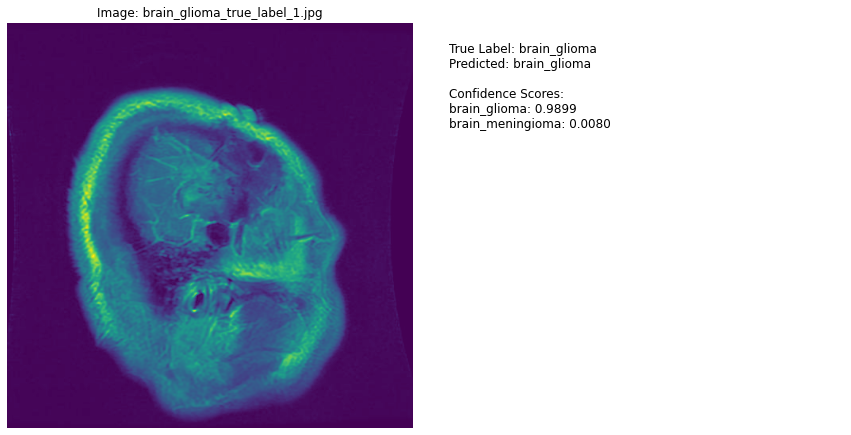


Top predictions for ./medxformer_images_for_inferences/brain/brain_glioma/brain_glioma_true_label_2.jpg:
brain_glioma: 0.9949
brain_pituitary: 0.0045


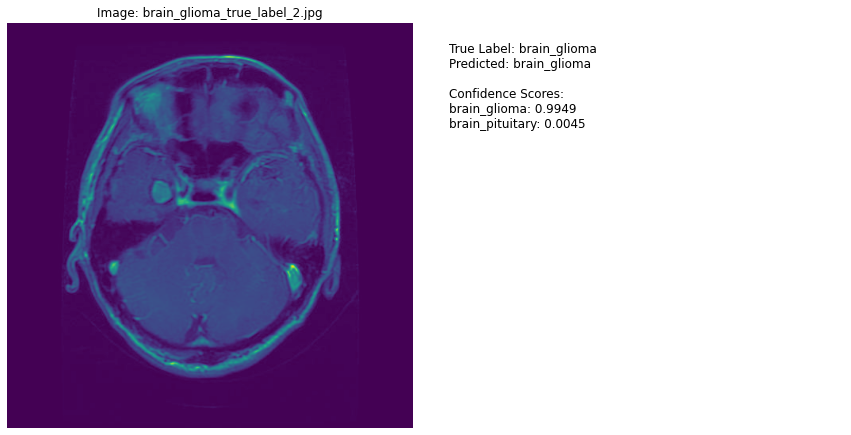


Top predictions for ./medxformer_images_for_inferences/brain/brain_glioma/brain_glioma_true_label_3.jpg:
brain_glioma: 0.9981
brain_pituitary: 0.0010


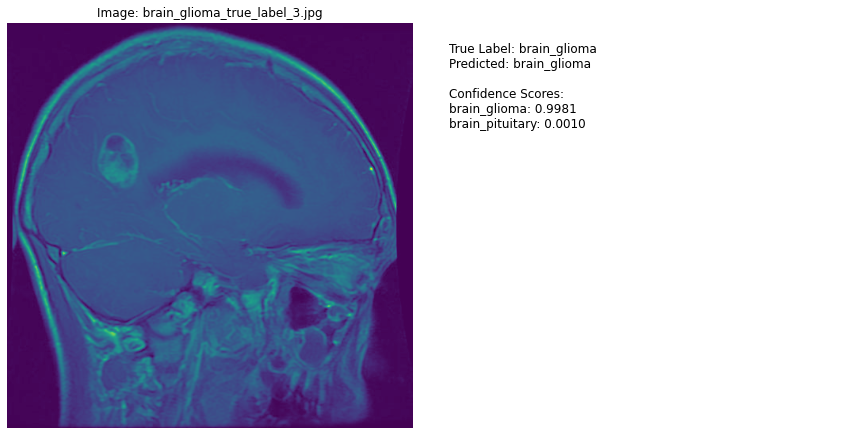


Classifying images in brain_meningioma folder:

Top predictions for ./medxformer_images_for_inferences/brain/brain_meningioma/brain_meningioma_true_label_1.jpg:
brain_meningioma: 0.9995
brain_pituitary: 0.0002


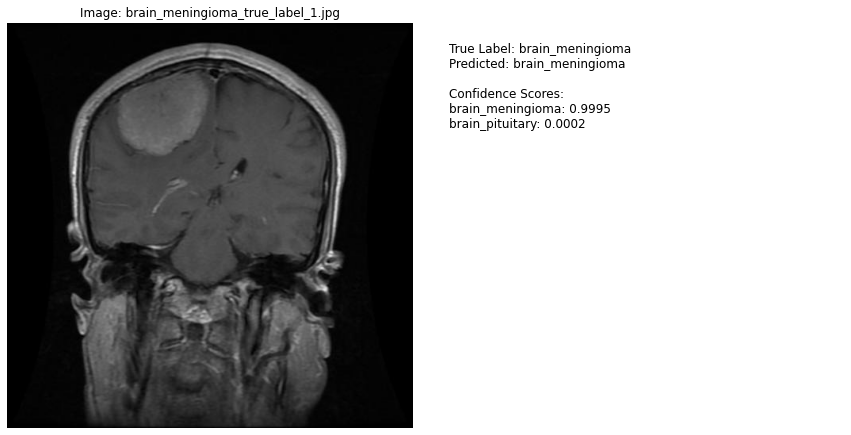


Top predictions for ./medxformer_images_for_inferences/brain/brain_meningioma/brain_meningioma_true_label_2.jpg:
brain_meningioma: 0.9988
brain_no_tumor: 0.0007


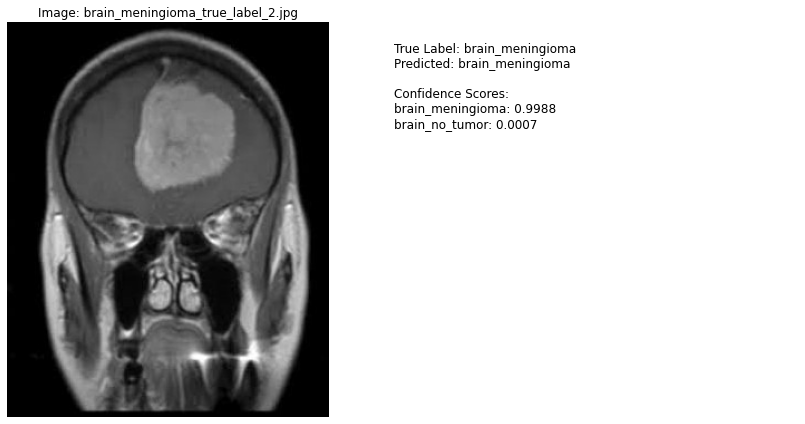


Top predictions for ./medxformer_images_for_inferences/brain/brain_meningioma/brain_meningioma_true_label_3.jpg:
brain_meningioma: 0.9989
brain_pituitary: 0.0005


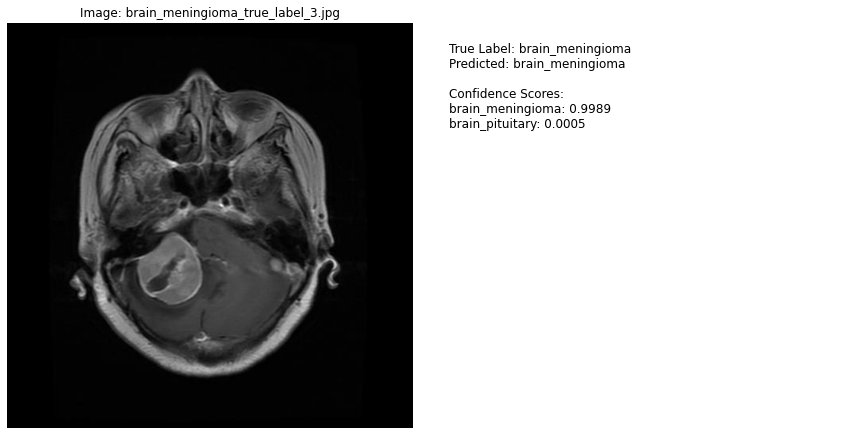


Classifying images in brain_no_tumor folder:

Top predictions for ./medxformer_images_for_inferences/brain/brain_no_tumor/brain_no_tumor_true_label_1.jpg:
brain_no_tumor: 0.9996
brain_meningioma: 0.0002


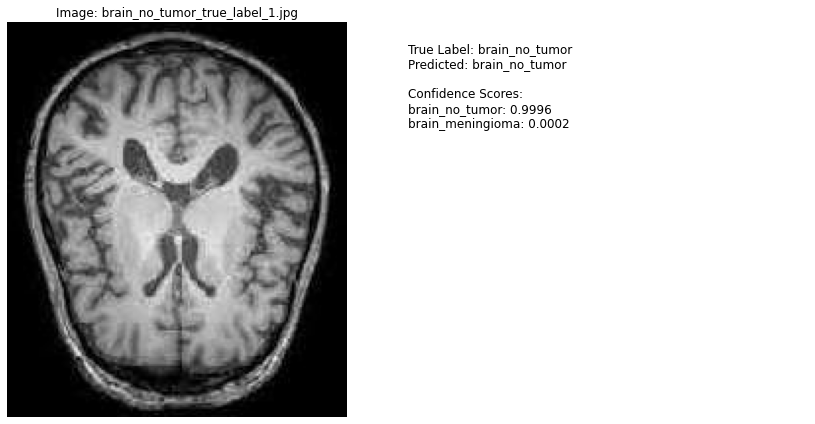


Top predictions for ./medxformer_images_for_inferences/brain/brain_no_tumor/brain_no_tumor_true_label_2.jpg:
brain_no_tumor: 0.9998
brain_meningioma: 0.0001


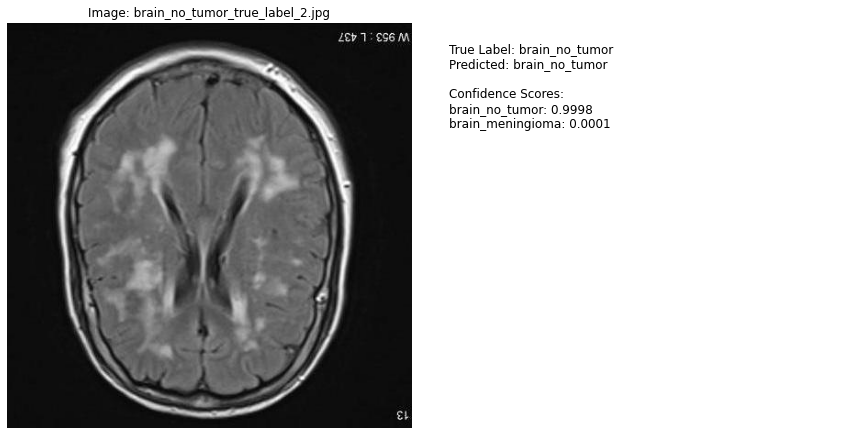


Top predictions for ./medxformer_images_for_inferences/brain/brain_no_tumor/brain_no_tumor_true_label_3.jpg:
brain_no_tumor: 0.9998
brain_meningioma: 0.0001


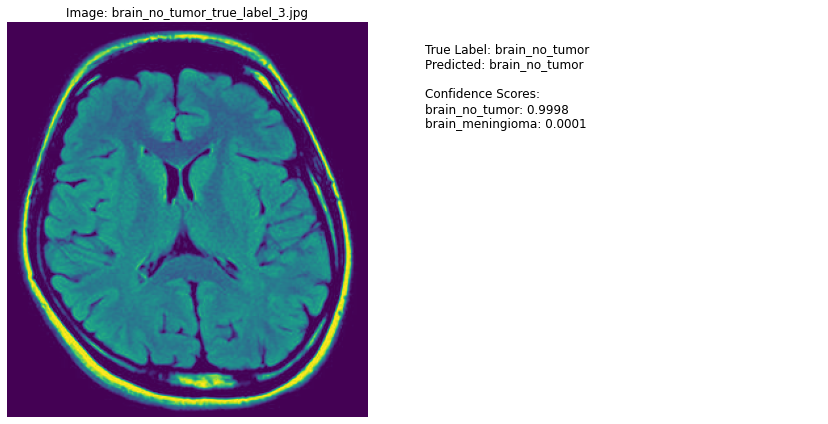


Classifying images in brain_pituitary folder:

Top predictions for ./medxformer_images_for_inferences/brain/brain_pituitary/brain_pituitary_true_label_1.jpg:
brain_pituitary: 0.9990
brain_glioma: 0.0005


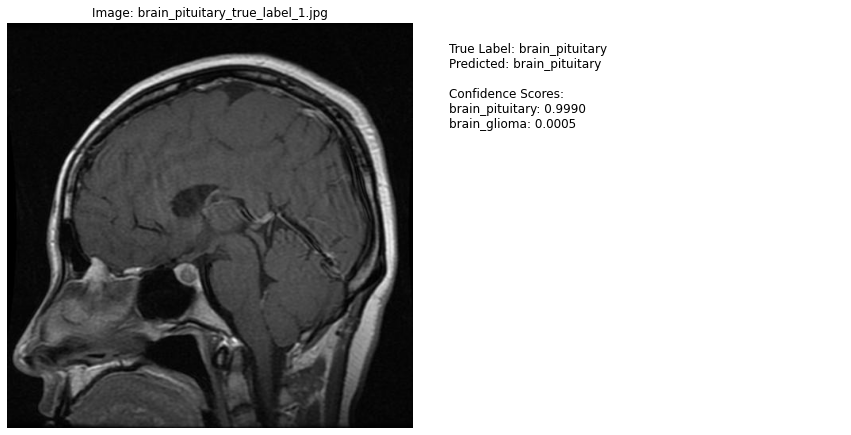


Top predictions for ./medxformer_images_for_inferences/brain/brain_pituitary/brain_pituitary_true_label_2.jpg:
brain_pituitary: 0.9997
brain_glioma: 0.0001


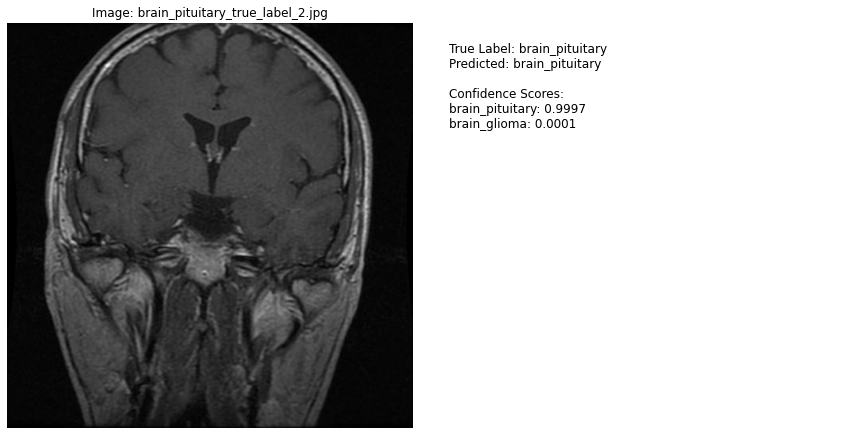


Top predictions for ./medxformer_images_for_inferences/brain/brain_pituitary/brain_pituitary_true_label_3.jpg:
brain_pituitary: 0.9969
brain_meningioma: 0.0022


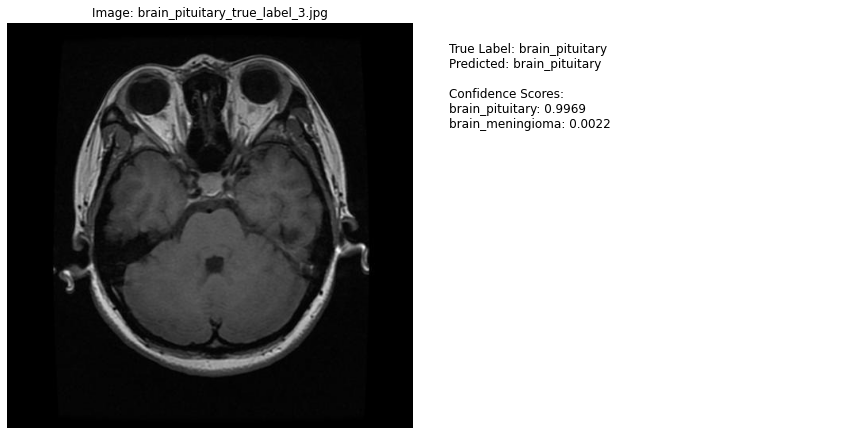

In [3]:
MODEL_PATH = "google/vit-base-patch16-224-in21k" 
ADAPTER_PATH = "./medxformer_v3/BRAIN_TUMOR_ADAPTER_MODEL_loha"
IMAGES_FOLDER = "./medxformer_images_for_inferences/brain" 
MAPPINGS_PATH = "./medxformer_v3/BRAIN_TUMOR_ADAPTER_MODEL_loha/mappings.json" 

label2id, id2label = load_mappings()
num_labels = len(id2label)
model, processor = load_model(num_labels)
model.eval()
for tumor_type in os.listdir(IMAGES_FOLDER):
    tumor_path = os.path.join(IMAGES_FOLDER, tumor_type)
    if not os.path.isdir(tumor_path):
        continue
    
    print(f"\nClassifying images in {tumor_type} folder:")
    for image_name in os.listdir(tumor_path):
        image_path = os.path.join(tumor_path, image_name)
        if not image_name.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
            continue
        true_label = tumor_type
        prediction, top_prob, top_predid = classify_image(model, processor, image_path, id2label)
        visualize_image(image_path, prediction, true_label, top_prob, top_predid, id2label)

## Diabetic Retinopathy Classification with best weights

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



Classifying images in diabetic_mild_retinopathy folder:

Top predictions for ./medxformer_images_for_inferences/diabetic/diabetic_mild_retinopathy/diabetic_mild_retinopathy_true_label_1.png:
diabetic_mild_retinopathy: 0.6176
diabetic_no_retinopathy: 0.3767


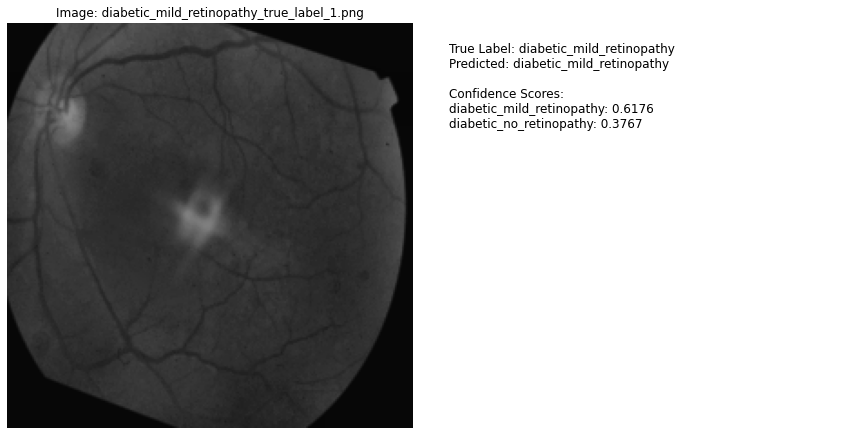


Top predictions for ./medxformer_images_for_inferences/diabetic/diabetic_mild_retinopathy/diabetic_mild_retinopathy_true_label_2.png:
diabetic_moderate_retinopathy: 0.8083
diabetic_proliferative_retinopathy: 0.0995


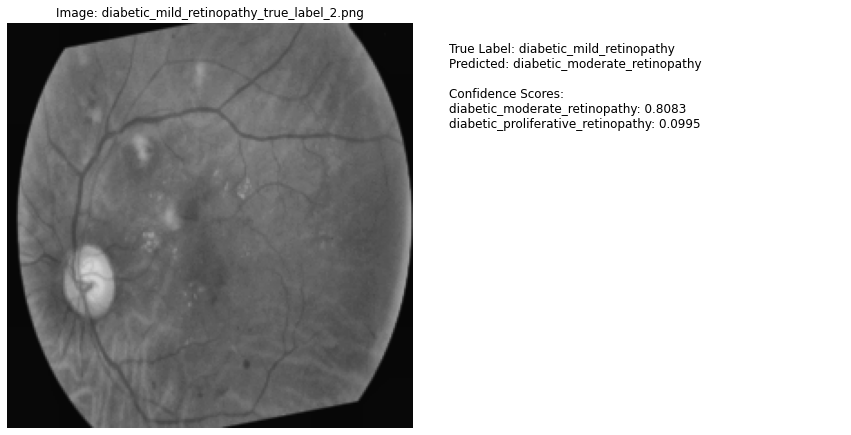


Top predictions for ./medxformer_images_for_inferences/diabetic/diabetic_mild_retinopathy/diabetic_mild_retinopathy_true_label_3.png:
diabetic_mild_retinopathy: 0.9423
diabetic_no_retinopathy: 0.0461


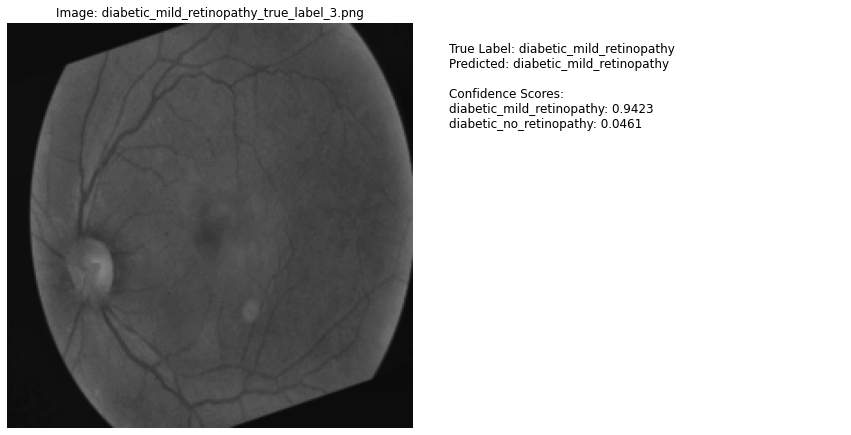


Classifying images in diabetic_moderate_retinopathy folder:

Top predictions for ./medxformer_images_for_inferences/diabetic/diabetic_moderate_retinopathy/diabetic_moderate_retinopathy_true_label_1.png:
diabetic_moderate_retinopathy: 0.6875
diabetic_severe_retinopathy: 0.1779


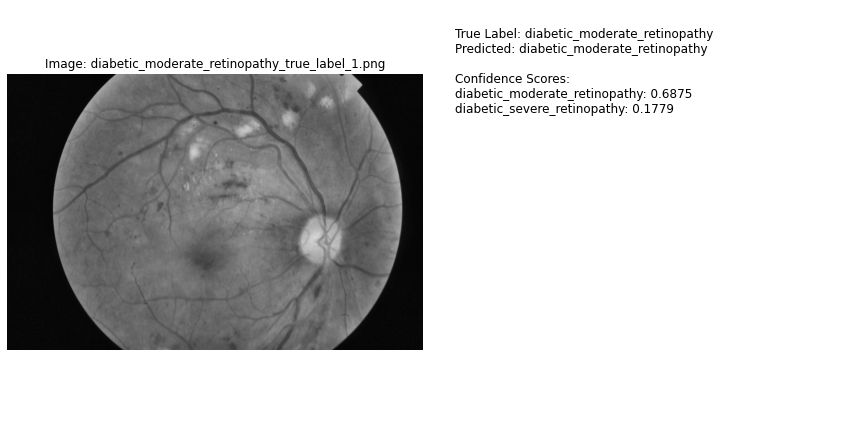


Top predictions for ./medxformer_images_for_inferences/diabetic/diabetic_moderate_retinopathy/diabetic_moderate_retinopathy_true_label_2.png:
diabetic_moderate_retinopathy: 0.5481
diabetic_severe_retinopathy: 0.3076


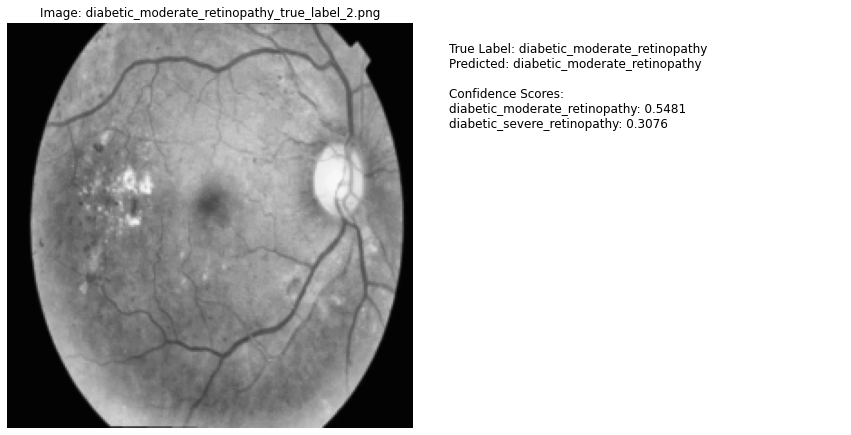


Top predictions for ./medxformer_images_for_inferences/diabetic/diabetic_moderate_retinopathy/diabetic_moderate_retinopathy_true_label_3.png:
diabetic_moderate_retinopathy: 0.7255
diabetic_severe_retinopathy: 0.1598


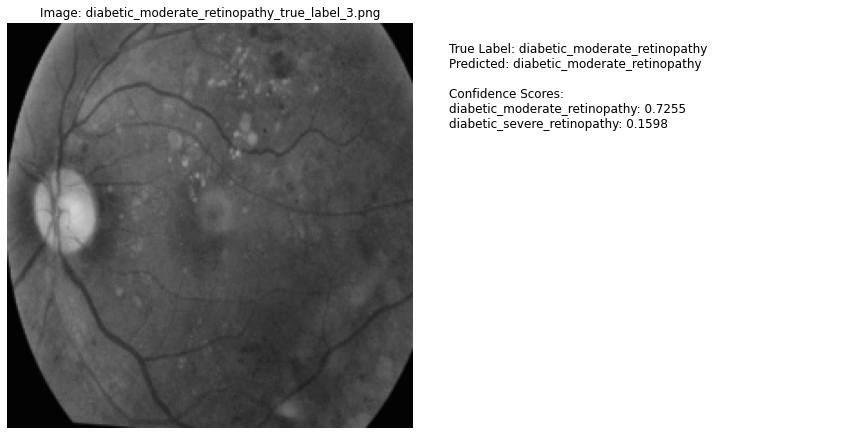


Classifying images in diabetic_no_retinopathy folder:

Top predictions for ./medxformer_images_for_inferences/diabetic/diabetic_no_retinopathy/diabetic_no_retinopathy_true_label_1.png:
diabetic_no_retinopathy: 0.9963
diabetic_mild_retinopathy: 0.0026


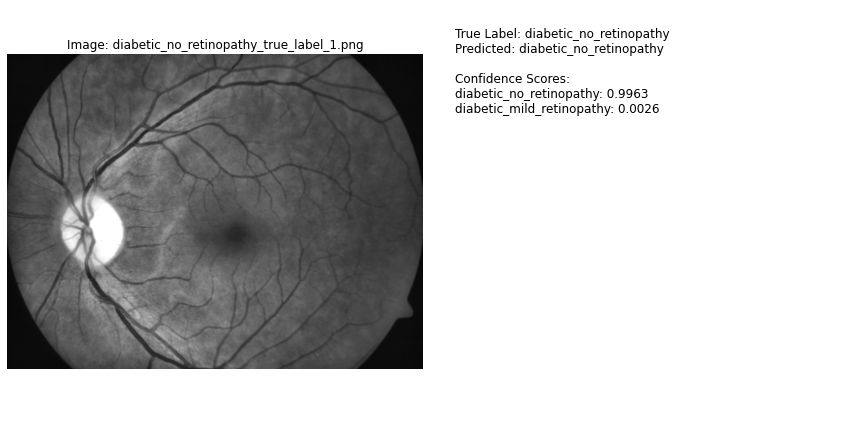


Top predictions for ./medxformer_images_for_inferences/diabetic/diabetic_no_retinopathy/diabetic_no_retinopathy_true_label_2.png:
diabetic_no_retinopathy: 0.9962
diabetic_mild_retinopathy: 0.0028


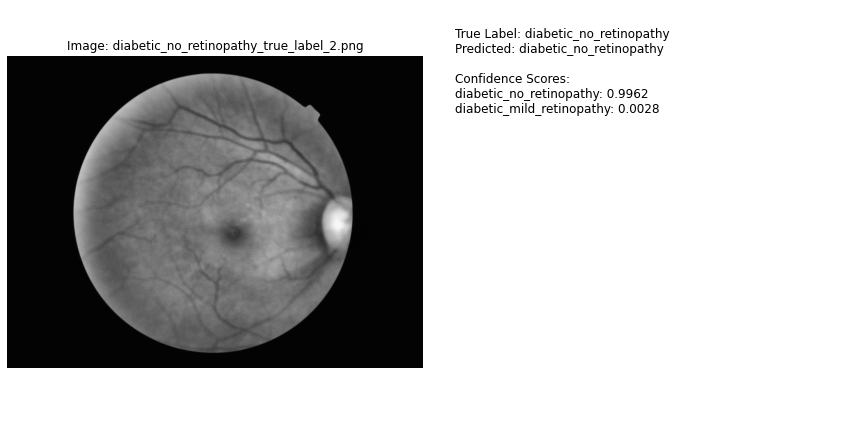


Top predictions for ./medxformer_images_for_inferences/diabetic/diabetic_no_retinopathy/diabetic_no_retinopathy_true_label_3.png:
diabetic_no_retinopathy: 0.9890
diabetic_mild_retinopathy: 0.0093


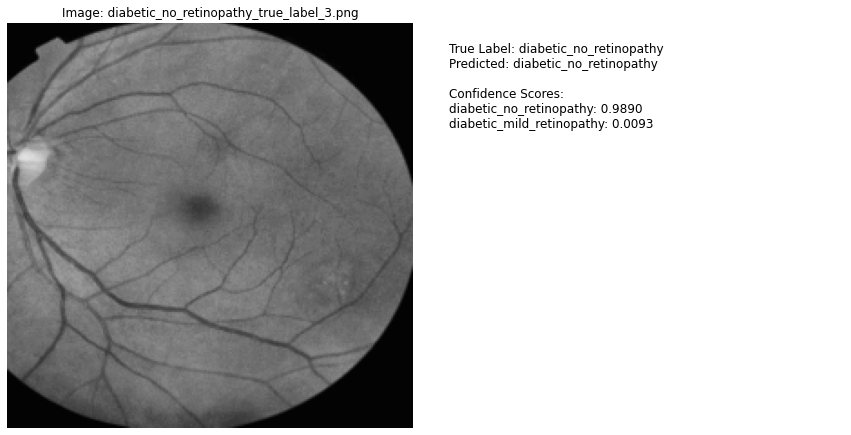


Classifying images in diabetic_proliferative_retinopathy folder:

Top predictions for ./medxformer_images_for_inferences/diabetic/diabetic_proliferative_retinopathy/diabetic_proliferative_retinopathy_true_label_1.png:
diabetic_severe_retinopathy: 0.9520
diabetic_proliferative_retinopathy: 0.0275


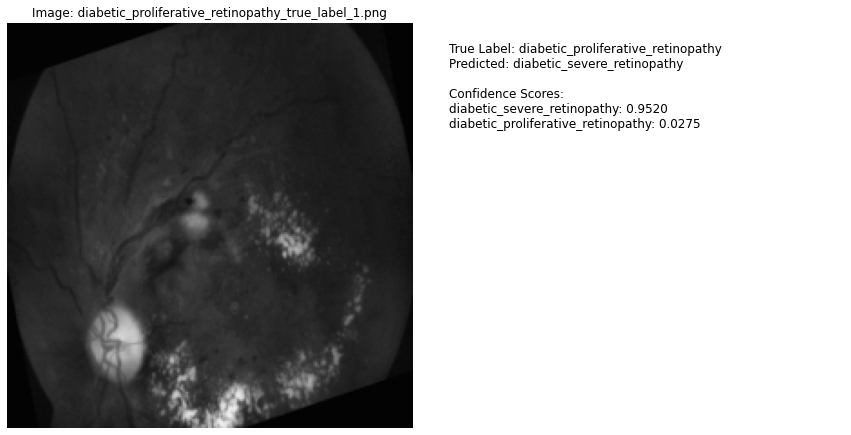


Top predictions for ./medxformer_images_for_inferences/diabetic/diabetic_proliferative_retinopathy/diabetic_proliferative_retinopathy_true_label_2.png:
diabetic_severe_retinopathy: 0.5300
diabetic_proliferative_retinopathy: 0.4262


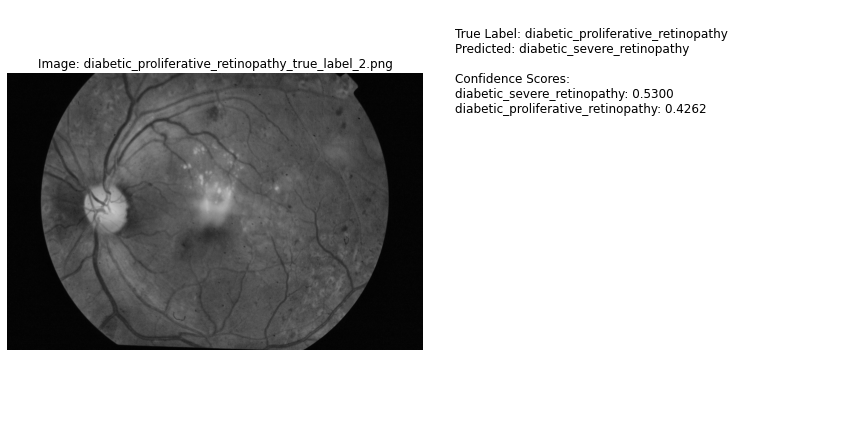


Top predictions for ./medxformer_images_for_inferences/diabetic/diabetic_proliferative_retinopathy/diabetic_proliferative_retinopathy_true_label_3.png:
diabetic_moderate_retinopathy: 0.4036
diabetic_mild_retinopathy: 0.2907


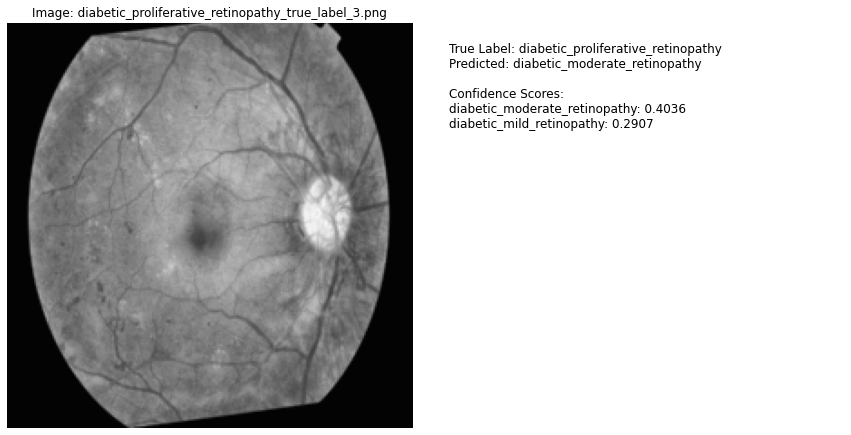


Classifying images in diabetic_severe_retinopathy folder:

Top predictions for ./medxformer_images_for_inferences/diabetic/diabetic_severe_retinopathy/diabetic_severe_retinopathy_true_label_1.png:
diabetic_severe_retinopathy: 0.9385
diabetic_moderate_retinopathy: 0.0533


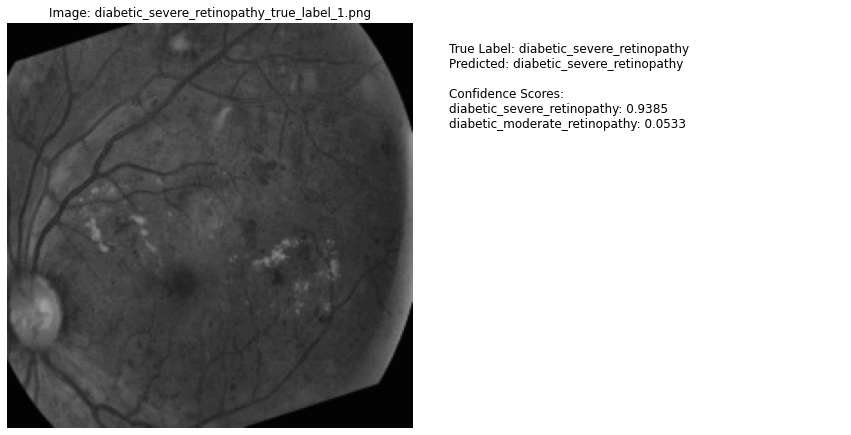


Top predictions for ./medxformer_images_for_inferences/diabetic/diabetic_severe_retinopathy/diabetic_severe_retinopathy_true_label_2.png:
diabetic_severe_retinopathy: 0.6097
diabetic_proliferative_retinopathy: 0.2900


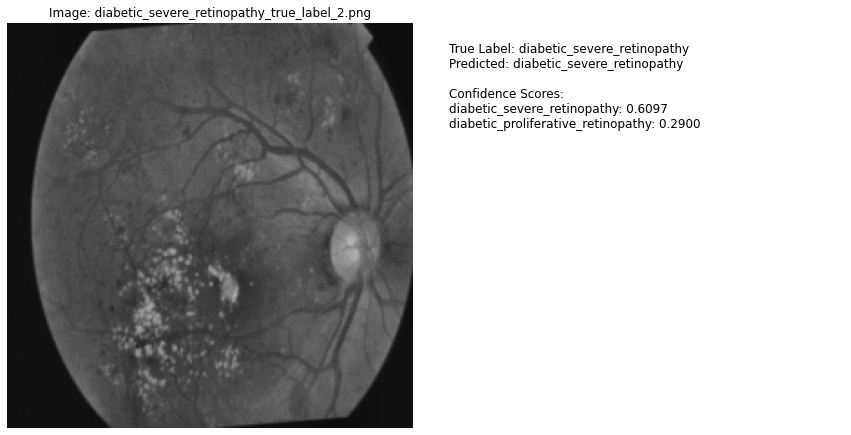


Top predictions for ./medxformer_images_for_inferences/diabetic/diabetic_severe_retinopathy/diabetic_severe_retinopathy_true_label_3.png:
diabetic_severe_retinopathy: 0.8404
diabetic_proliferative_retinopathy: 0.1096


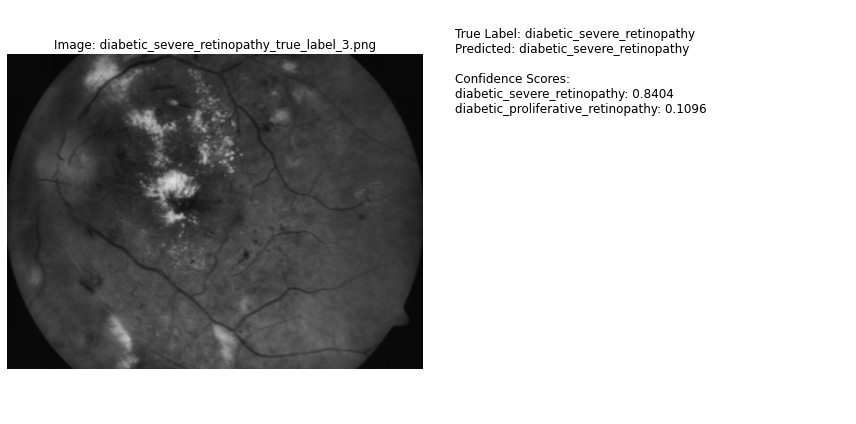

In [4]:
MODEL_PATH = "google/vit-base-patch16-224-in21k" 
ADAPTER_PATH = "./medxformer_v3/DIABETIC_ADAPTER_MODEL_loha"
IMAGES_FOLDER = "./medxformer_images_for_inferences/diabetic" 
MAPPINGS_PATH = "./medxformer_v3/DIABETIC_ADAPTER_MODEL_loha/mappings.json" 

label2id, id2label = load_mappings()
num_labels = len(id2label)
model, processor = load_model(num_labels)
model.eval()
for diabetic_type in os.listdir(IMAGES_FOLDER):
    diabetic_path = os.path.join(IMAGES_FOLDER, diabetic_type)
    if not os.path.isdir(diabetic_path):
        continue
    
    print(f"\nClassifying images in {diabetic_type} folder:")
    for image_name in os.listdir(diabetic_path):
        image_path = os.path.join(diabetic_path, image_name)
        if not image_name.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
            continue
        true_label = diabetic_type
        prediction, top_prob, top_predid = classify_image(model, processor, image_path, id2label)
        visualize_image(image_path, prediction, true_label, top_prob, top_predid, id2label)

## Kidney Disease Classification with best weights

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



Classifying images in kidney_cyst folder:

Top predictions for ./medxformer_images_for_inferences/kidney/kidney_cyst/kidney_cyst_true_label_1_unfiltered.jpg:
kidney_cyst: 0.9984
kidney_tumor: 0.0008


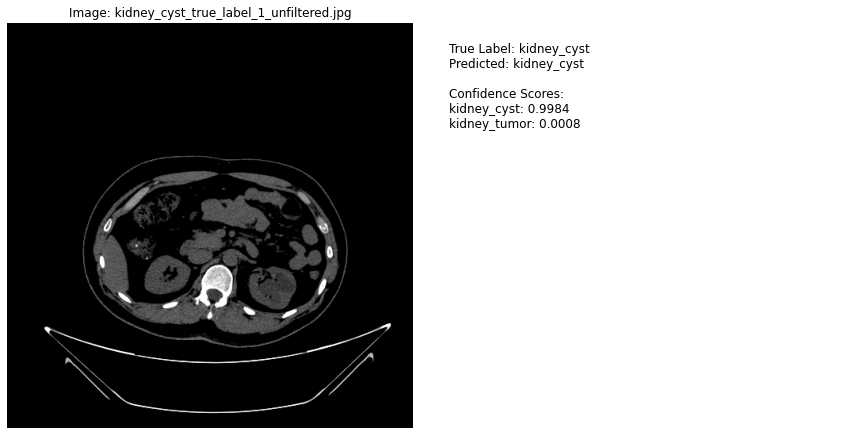


Top predictions for ./medxformer_images_for_inferences/kidney/kidney_cyst/kidney_cyst_true_label_2_unfiltered.jpg:
kidney_cyst: 0.9984
kidney_tumor: 0.0008


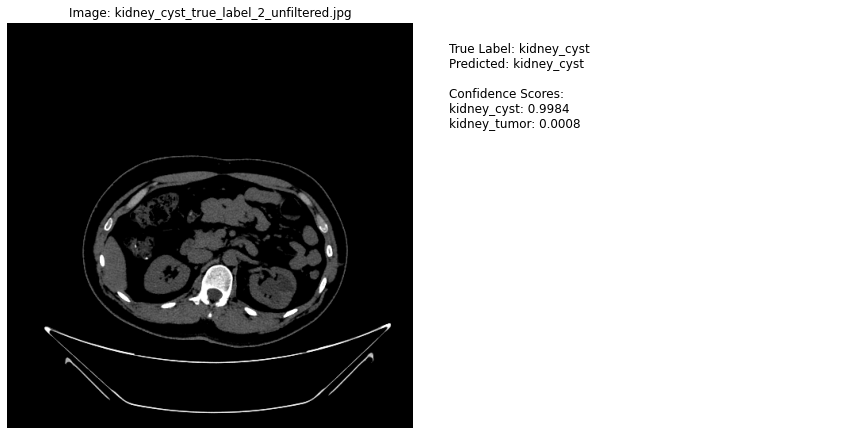


Top predictions for ./medxformer_images_for_inferences/kidney/kidney_cyst/kidney_cyst_true_label_3_unfiltered.jpg:
kidney_cyst: 0.9963
kidney_stone: 0.0025


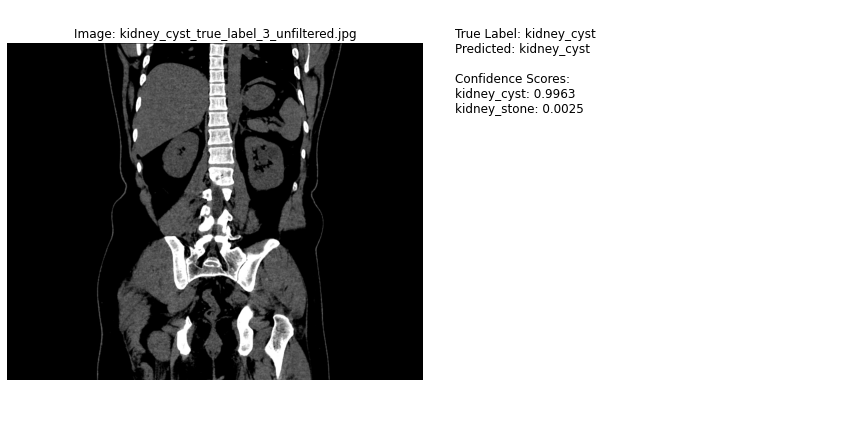


Classifying images in kidney_normal folder:

Top predictions for ./medxformer_images_for_inferences/kidney/kidney_normal/kidney_normal_true_label_1_unfiltered.jpg:
kidney_normal: 0.9594
kidney_stone: 0.0405


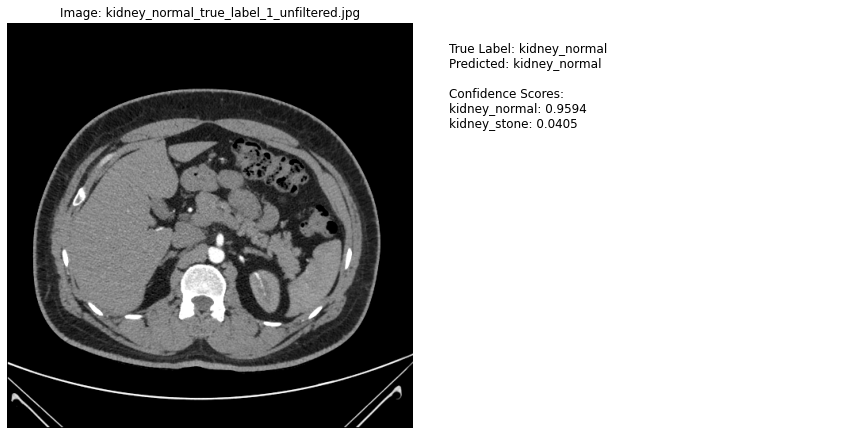


Top predictions for ./medxformer_images_for_inferences/kidney/kidney_normal/kidney_normal_true_label_2_unfiltered.jpg:
kidney_normal: 0.9989
kidney_tumor: 0.0010


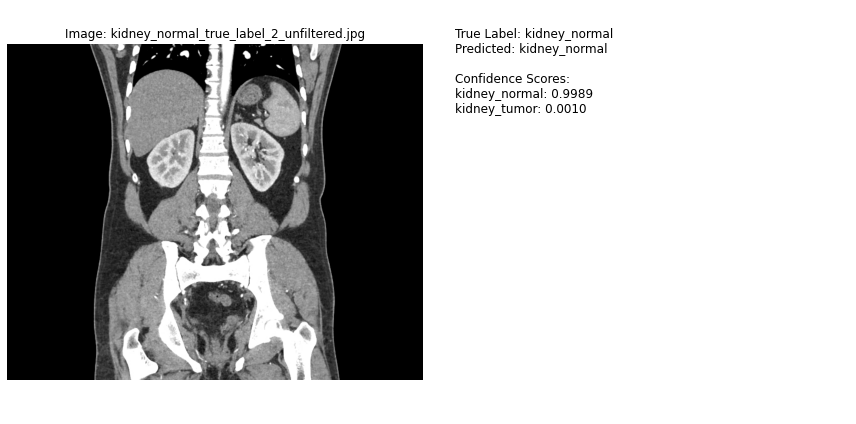


Top predictions for ./medxformer_images_for_inferences/kidney/kidney_normal/kidney_normal_true_label_3_unfiltered.jpg:
kidney_normal: 0.9993
kidney_tumor: 0.0006


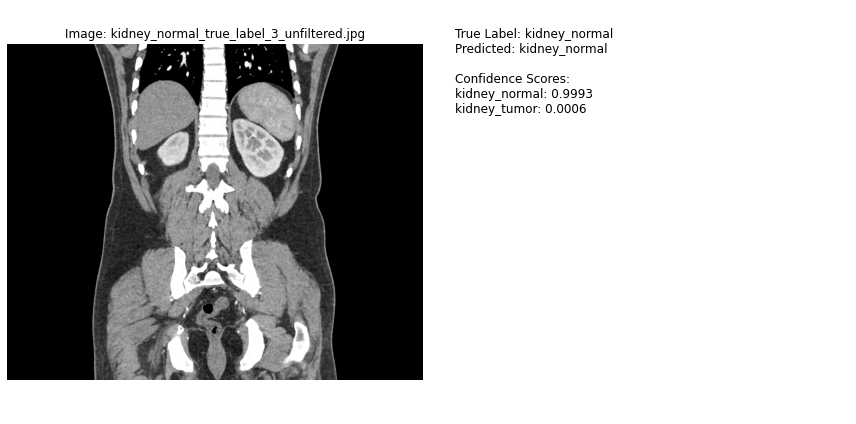


Classifying images in kidney_stone folder:

Top predictions for ./medxformer_images_for_inferences/kidney/kidney_stone/kidney_stone_true_label_1_unfiltered.jpg:
kidney_stone: 0.9989
kidney_normal: 0.0007


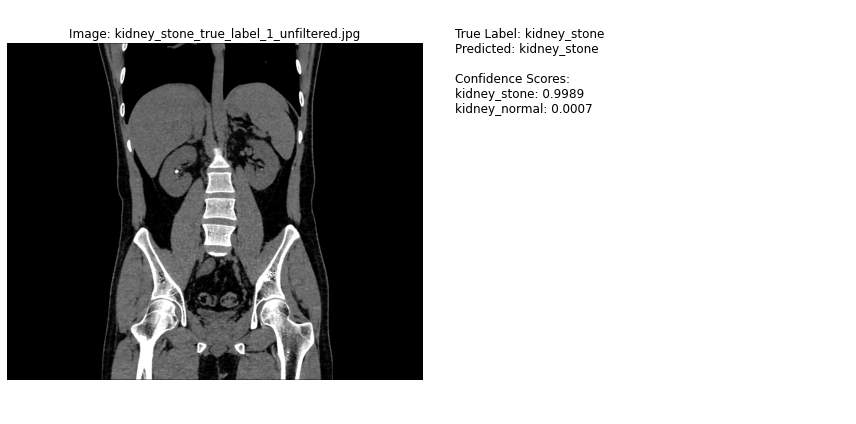


Top predictions for ./medxformer_images_for_inferences/kidney/kidney_stone/kidney_stone_true_label_2_unfiltered.jpg:
kidney_stone: 0.9963
kidney_normal: 0.0031


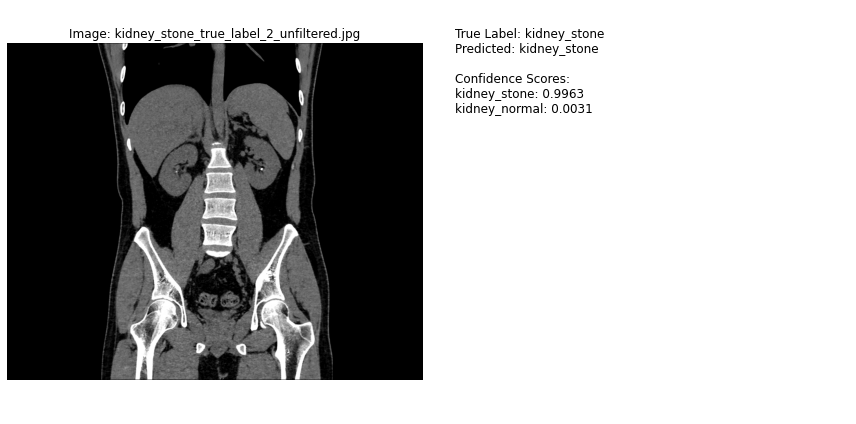


Top predictions for ./medxformer_images_for_inferences/kidney/kidney_stone/kidney_stone_true_label_3_unfiltered.jpg:
kidney_stone: 0.9985
kidney_cyst: 0.0009


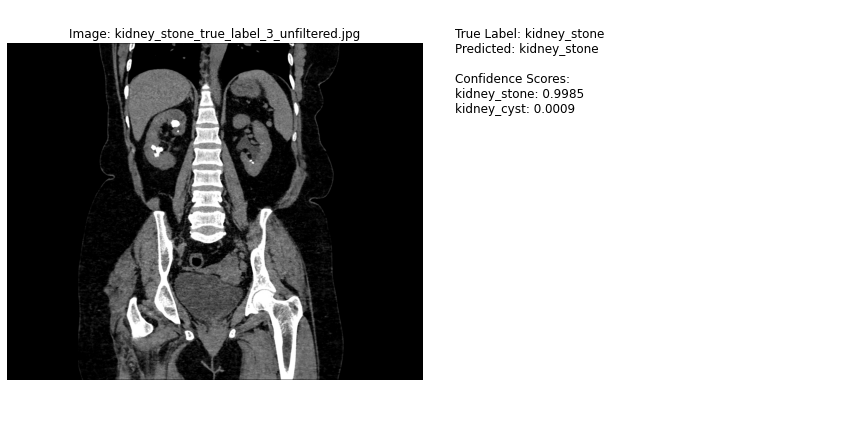


Classifying images in kidney_tumor folder:

Top predictions for ./medxformer_images_for_inferences/kidney/kidney_tumor/kidney_tumor_true_label_1_unfiltered.jpg:
kidney_tumor: 0.9975
kidney_normal: 0.0012


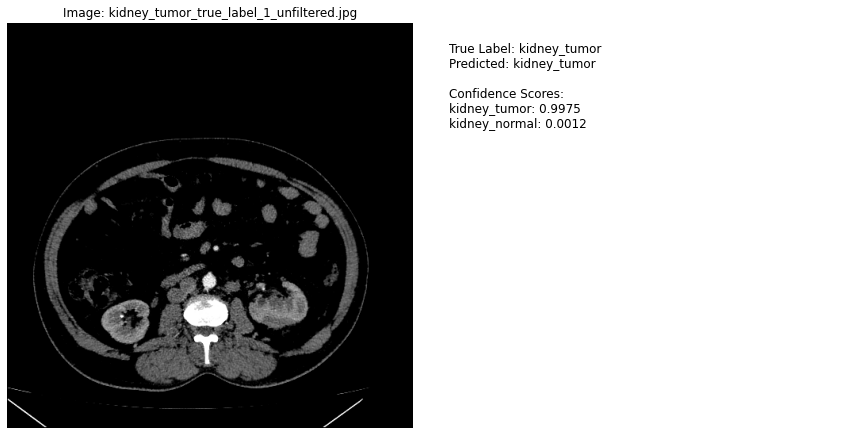


Top predictions for ./medxformer_images_for_inferences/kidney/kidney_tumor/kidney_tumor_true_label_2_unfiltered.jpg:
kidney_tumor: 0.9967
kidney_cyst: 0.0017


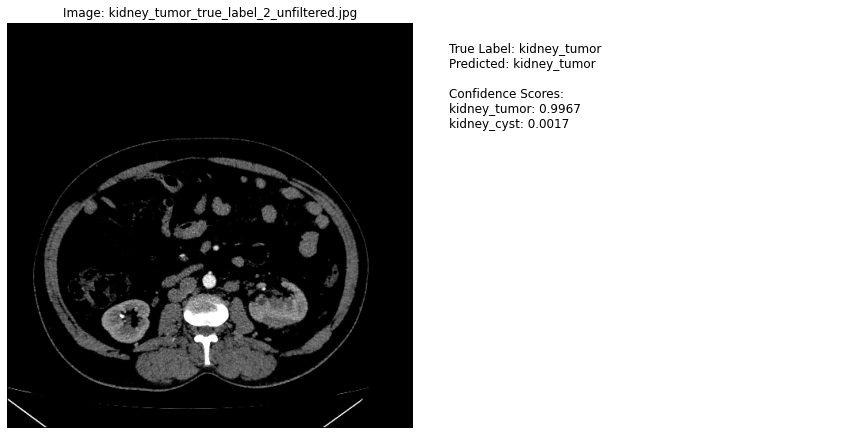


Top predictions for ./medxformer_images_for_inferences/kidney/kidney_tumor/kidney_tumor_true_label_3_unfiltered.jpg:
kidney_tumor: 0.9938
kidney_cyst: 0.0038


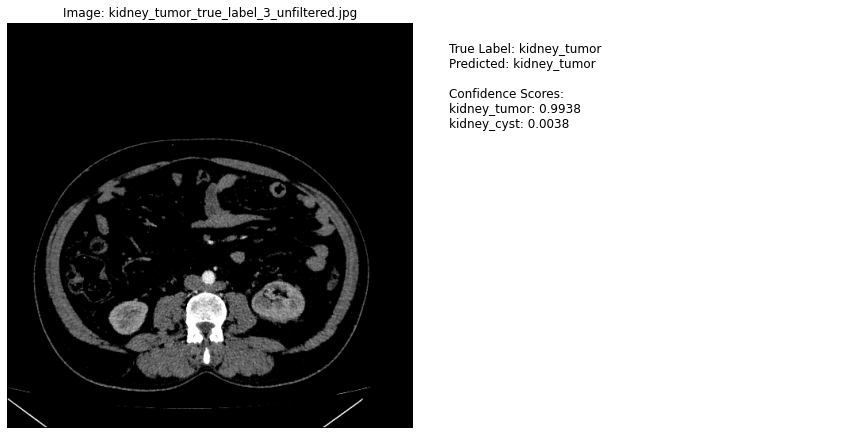

In [5]:
MODEL_PATH = "google/vit-base-patch16-224-in21k" 
ADAPTER_PATH = "./medxformer_v3/KIDNEY_ADAPTER_MODEL_loha"
IMAGES_FOLDER = "./medxformer_images_for_inferences/kidney" 
MAPPINGS_PATH = "./medxformer_v3/KIDNEY_ADAPTER_MODEL_lora/mappings.json" 

label2id, id2label = load_mappings()
num_labels = len(id2label)
model, processor = load_model(num_labels)
model.eval()
for kidney_type in os.listdir(IMAGES_FOLDER):
    kidney_path = os.path.join(IMAGES_FOLDER, kidney_type)
    if not os.path.isdir(kidney_path):
        continue
    
    print(f"\nClassifying images in {kidney_type} folder:")
    for image_name in os.listdir(kidney_path):
        image_path = os.path.join(kidney_path, image_name)
        if not image_name.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
            continue
        true_label = kidney_type
        prediction, top_prob, top_predid = classify_image(model, processor, image_path, id2label)
        visualize_image(image_path, prediction, true_label, top_prob, top_predid, id2label)

## Retina OCT Classification with best weights

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



Classifying images in retina_choroidal_neovascularization folder:

Top predictions for ./medxformer_images_for_inferences/retina/retina_choroidal_neovascularization/retina_choroidal_neovascularization_true_label_1.jpeg:
retina_choroidal_neovascularization: 0.9994
retina_drusen: 0.0005


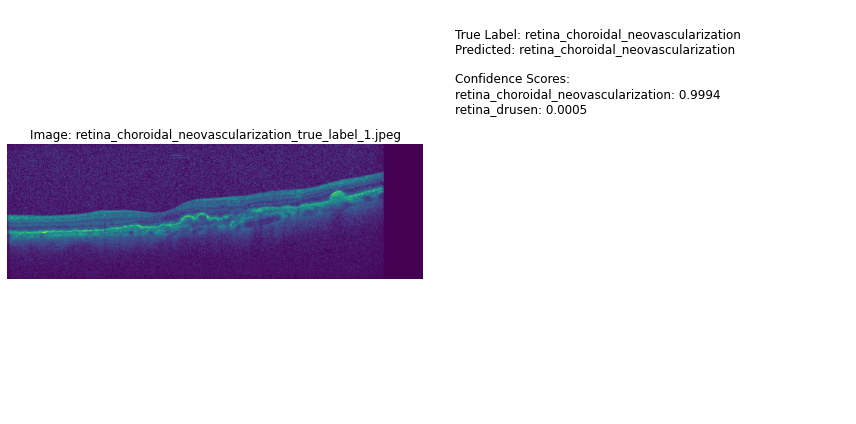


Top predictions for ./medxformer_images_for_inferences/retina/retina_choroidal_neovascularization/retina_choroidal_neovascularization_true_label_2.jpeg:
retina_choroidal_neovascularization: 0.9947
retina_diabetic_macular_edema: 0.0053


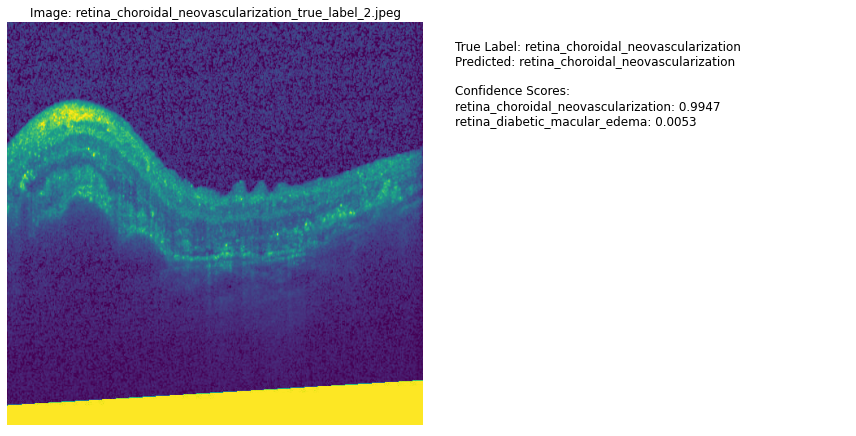


Top predictions for ./medxformer_images_for_inferences/retina/retina_choroidal_neovascularization/retina_choroidal_neovascularization_true_label_3.jpeg:
retina_choroidal_neovascularization: 0.9998
retina_diabetic_macular_edema: 0.0001


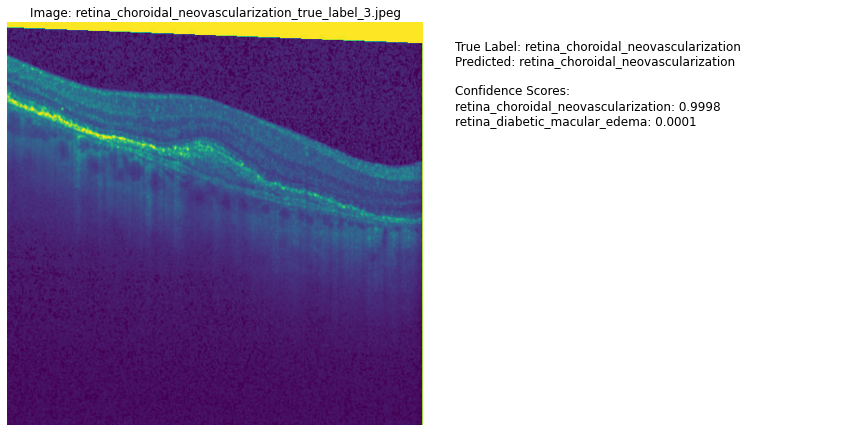


Classifying images in retina_diabetic_macular_edema folder:

Top predictions for ./medxformer_images_for_inferences/retina/retina_diabetic_macular_edema/retina_diabetic_macular_edema_true_label_1.jpeg:
retina_diabetic_macular_edema: 0.9999
retina_normal: 0.0000


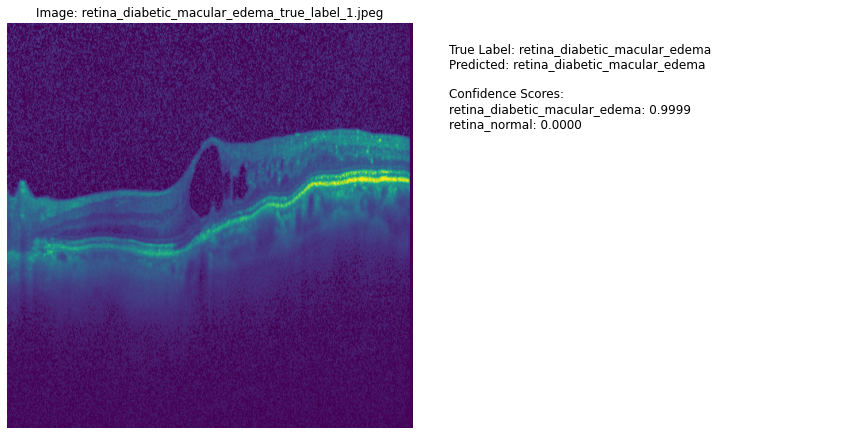


Top predictions for ./medxformer_images_for_inferences/retina/retina_diabetic_macular_edema/retina_diabetic_macular_edema_true_label_2.jpeg:
retina_diabetic_macular_edema: 0.9999
retina_normal: 0.0001


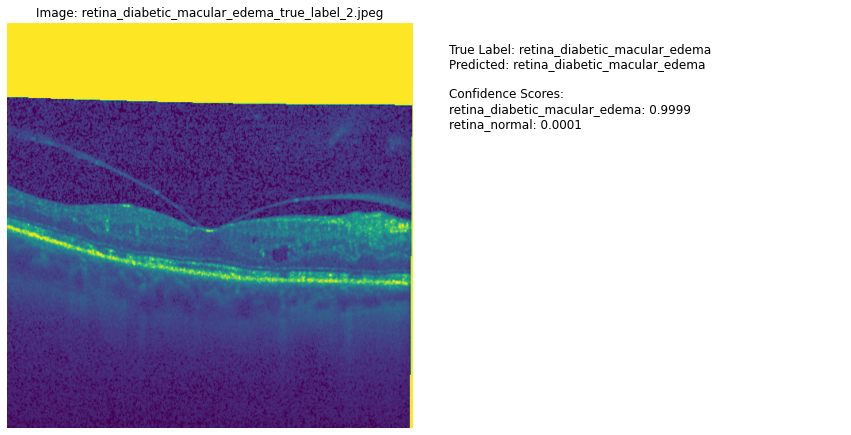


Top predictions for ./medxformer_images_for_inferences/retina/retina_diabetic_macular_edema/retina_diabetic_macular_edema_true_label_3.jpeg:
retina_diabetic_macular_edema: 0.9990
retina_normal: 0.0010


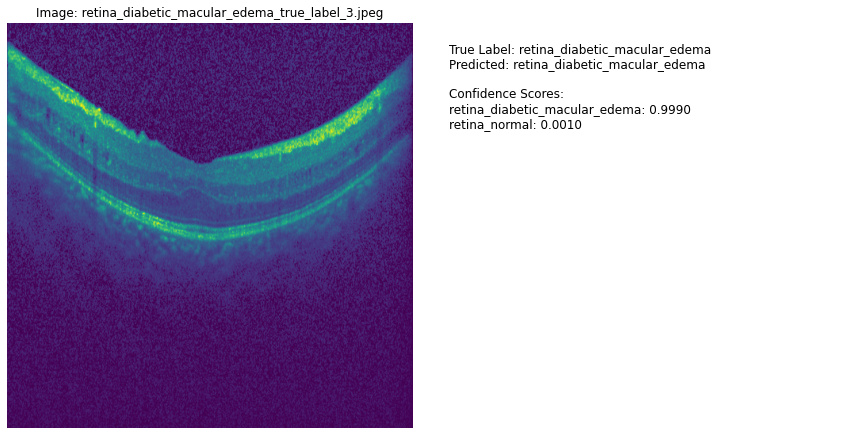


Classifying images in retina_drusen folder:

Top predictions for ./medxformer_images_for_inferences/retina/retina_drusen/retina_drusen_true_label_1.jpeg:
retina_drusen: 0.9961
retina_choroidal_neovascularization: 0.0035


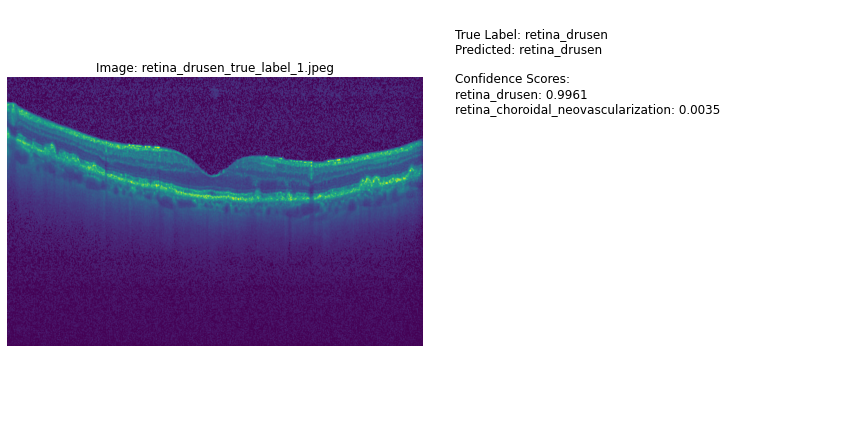


Top predictions for ./medxformer_images_for_inferences/retina/retina_drusen/retina_drusen_true_label_2.jpeg:
retina_drusen: 0.9536
retina_choroidal_neovascularization: 0.0449


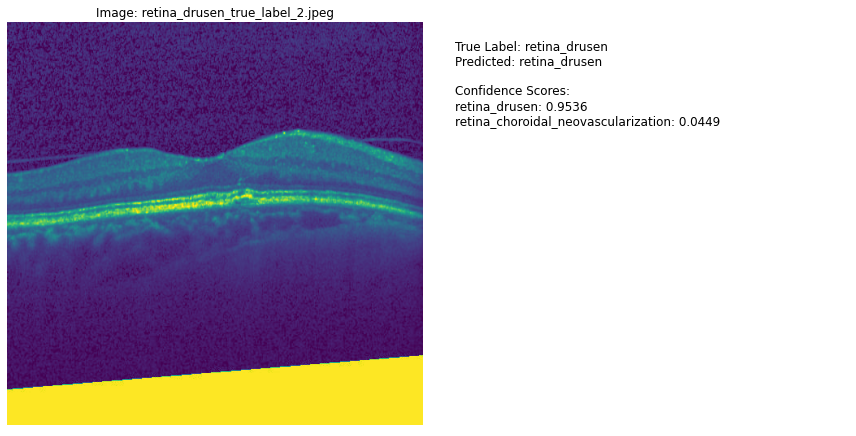


Top predictions for ./medxformer_images_for_inferences/retina/retina_drusen/retina_drusen_true_label_3.jpeg:
retina_drusen: 0.9996
retina_normal: 0.0002


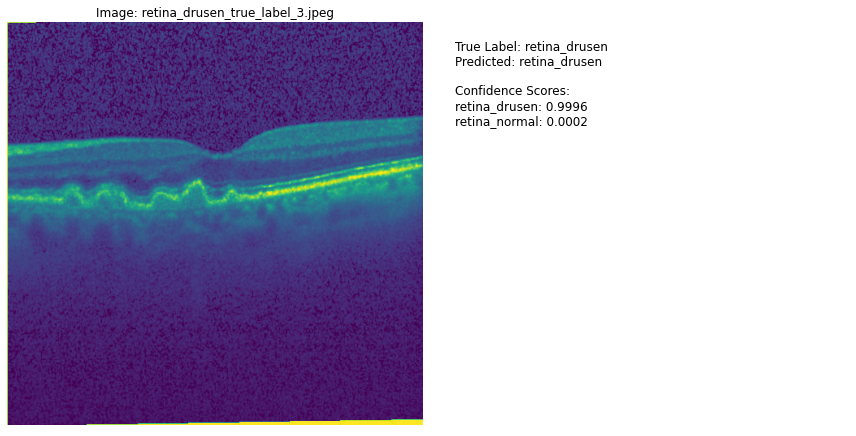


Classifying images in retina_normal folder:

Top predictions for ./medxformer_images_for_inferences/retina/retina_normal/retina_normal_true_label_1.jpeg:
retina_normal: 0.9935
retina_drusen: 0.0043


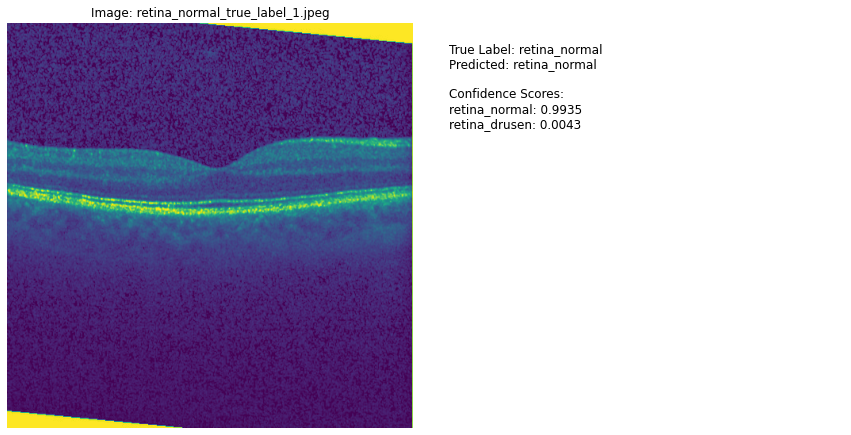


Top predictions for ./medxformer_images_for_inferences/retina/retina_normal/retina_normal_true_label_2.jpeg:
retina_normal: 0.9605
retina_drusen: 0.0391


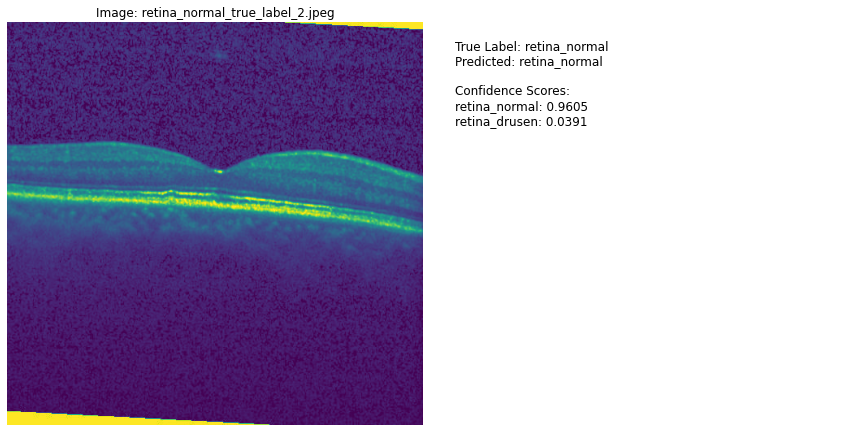


Top predictions for ./medxformer_images_for_inferences/retina/retina_normal/retina_normal_true_label_3.jpeg:
retina_normal: 0.9808
retina_diabetic_macular_edema: 0.0145


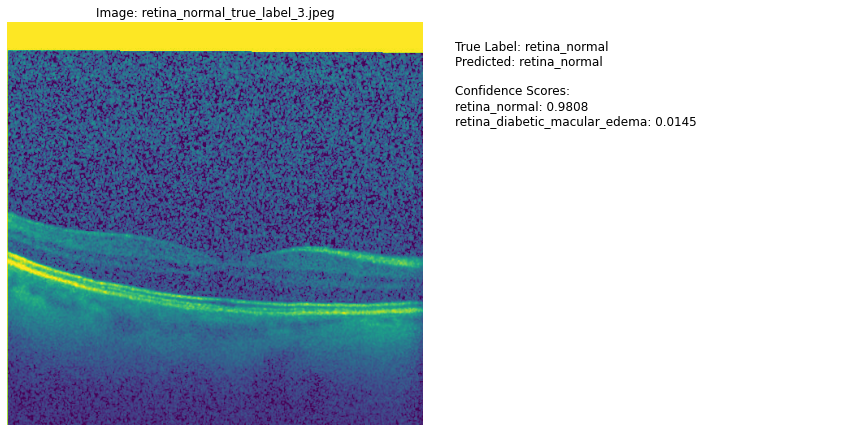

In [6]:
MODEL_PATH = "google/vit-base-patch16-224-in21k" 
ADAPTER_PATH = "./medxformer_v3/RETINA_ADAPTER_MODEL_loha"
IMAGES_FOLDER = "./medxformer_images_for_inferences/retina" 
MAPPINGS_PATH = "./medxformer_v3/RETINA_ADAPTER_MODEL_loha/mappings.json" 

label2id, id2label = load_mappings()
num_labels = len(id2label)
model, processor = load_model(num_labels)
model.eval()
for retina_type in os.listdir(IMAGES_FOLDER):
    retina_path = os.path.join(IMAGES_FOLDER, retina_type)
    if not os.path.isdir(retina_path):
        continue
    
    print(f"\nClassifying images in {retina_type} folder:")
    for image_name in os.listdir(retina_path):
        image_path = os.path.join(retina_path, image_name)
        if not image_name.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
            continue
        true_label = retina_type
        prediction, top_prob, top_predid = classify_image(model, processor, image_path, id2label)
        visualize_image(image_path, prediction, true_label, top_prob, top_predid, id2label)

## Skin Cancer Classification with best weights

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



Classifying images in skin_actinic_keratosis folder:

Top predictions for ./medxformer_images_for_inferences/skin_cancer/skin_actinic_keratosis/skin_actinic_keratosis_true_label_1.jpg:
skin_actinic_keratosis: 0.6243
skin_nevus: 0.3751


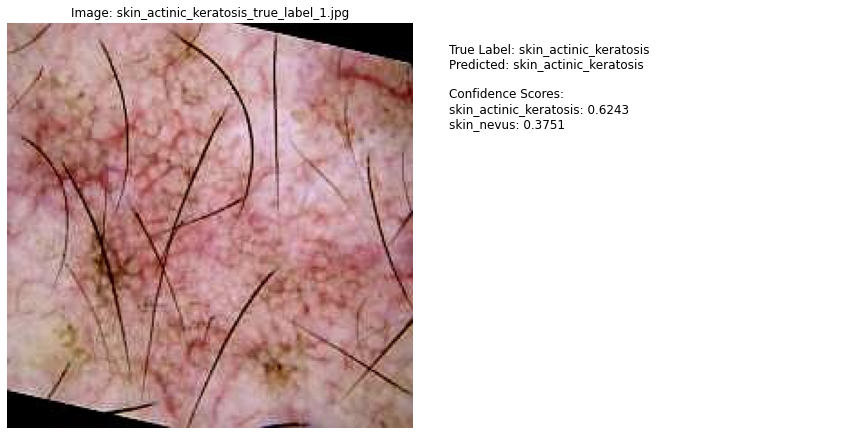


Top predictions for ./medxformer_images_for_inferences/skin_cancer/skin_actinic_keratosis/skin_actinic_keratosis_true_label_2.jpg:
skin_actinic_keratosis: 0.6349
skin_nevus: 0.3575


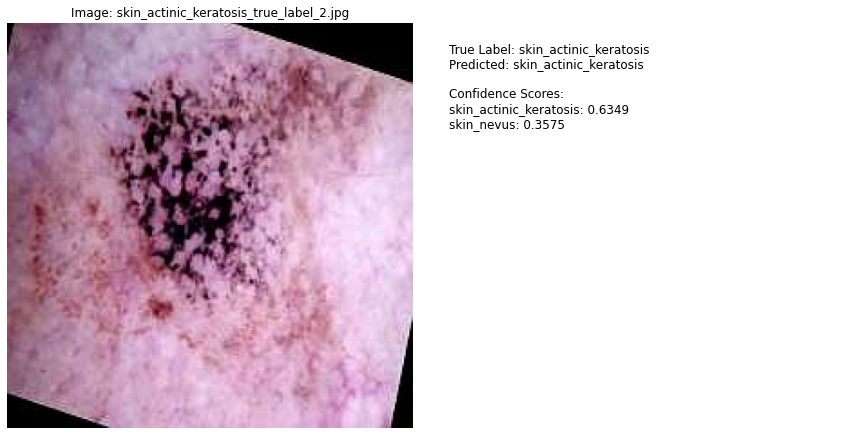


Top predictions for ./medxformer_images_for_inferences/skin_cancer/skin_actinic_keratosis/skin_actinic_keratosis_true_label_3.jpg:
skin_nevus: 0.5180
skin_actinic_keratosis: 0.4803


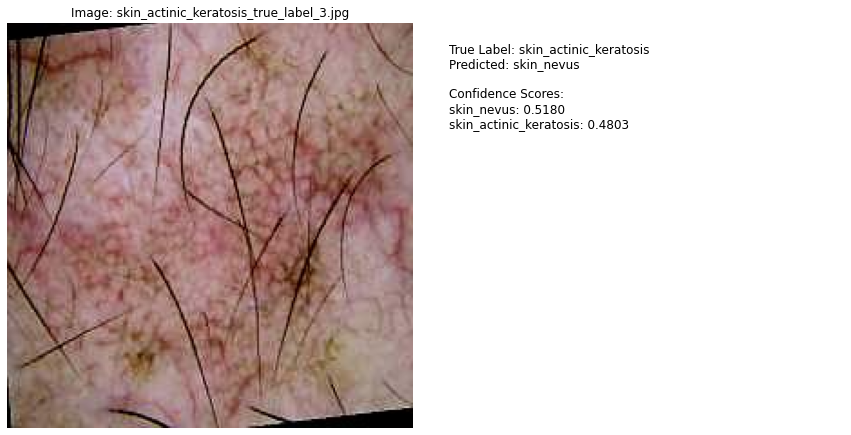


Classifying images in skin_basal_cell_carcinoma folder:

Top predictions for ./medxformer_images_for_inferences/skin_cancer/skin_basal_cell_carcinoma/skin_basal_cell_carcinoma_true_label_1.jpg:
skin_basal_cell_carcinoma: 1.0000
skin_pigmented_benign_keratosis: 0.0000


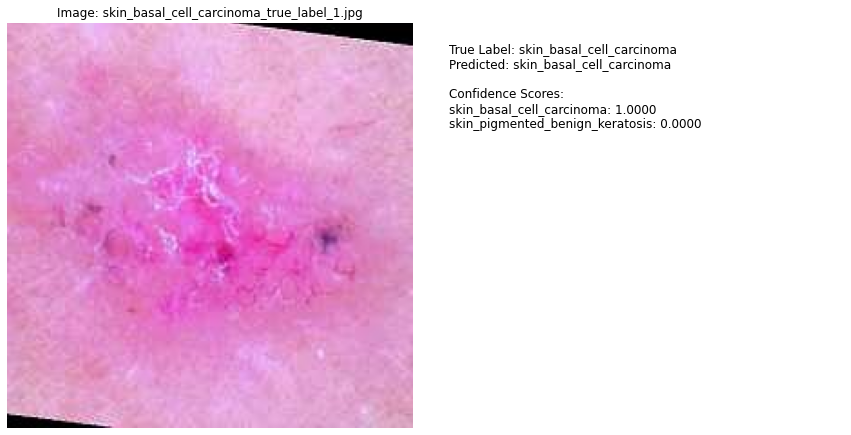


Top predictions for ./medxformer_images_for_inferences/skin_cancer/skin_basal_cell_carcinoma/skin_basal_cell_carcinoma_true_label_2.jpg:
skin_basal_cell_carcinoma: 0.9370
skin_pigmented_benign_keratosis: 0.0629


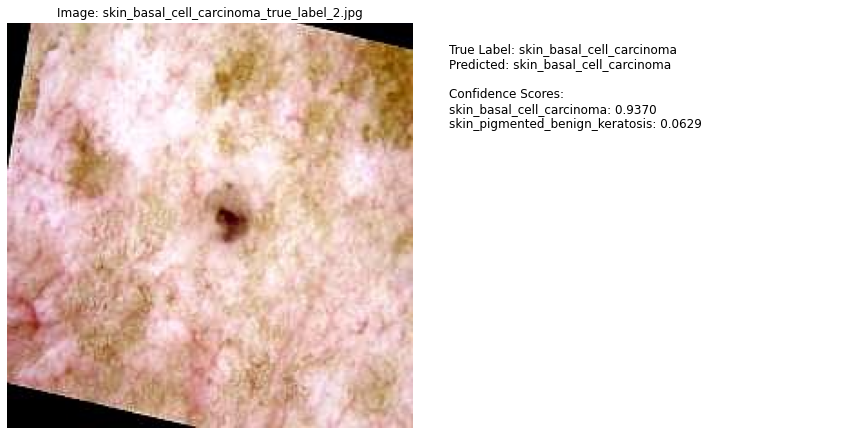


Top predictions for ./medxformer_images_for_inferences/skin_cancer/skin_basal_cell_carcinoma/skin_basal_cell_carcinoma_true_label_3.jpg:
skin_basal_cell_carcinoma: 0.9998
skin_squamous_cell_carcinoma: 0.0002


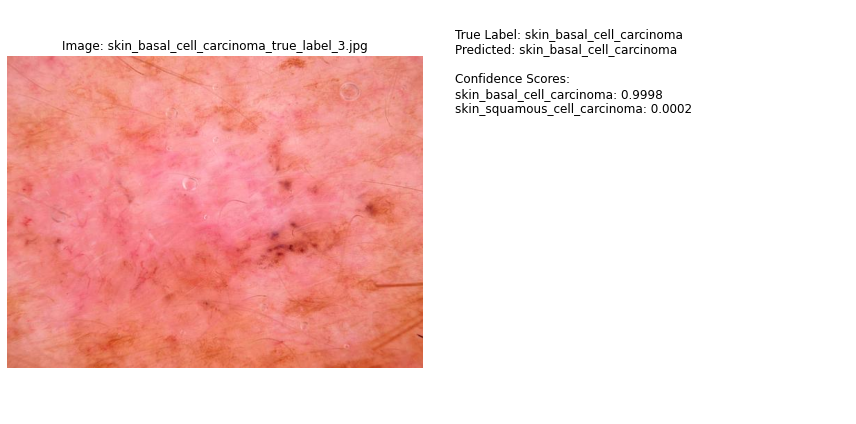


Classifying images in skin_dermatofibroma folder:

Top predictions for ./medxformer_images_for_inferences/skin_cancer/skin_dermatofibroma/skin_dermatofibroma_true_label_1.jpg:
skin_dermatofibroma: 0.9998
skin_nevus: 0.0001


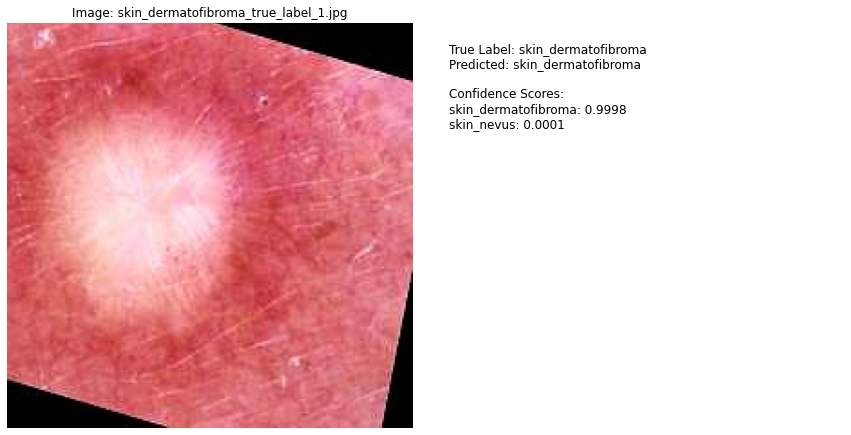


Top predictions for ./medxformer_images_for_inferences/skin_cancer/skin_dermatofibroma/skin_dermatofibroma_true_label_2.jpg:
skin_dermatofibroma: 0.9995
skin_pigmented_benign_keratosis: 0.0003


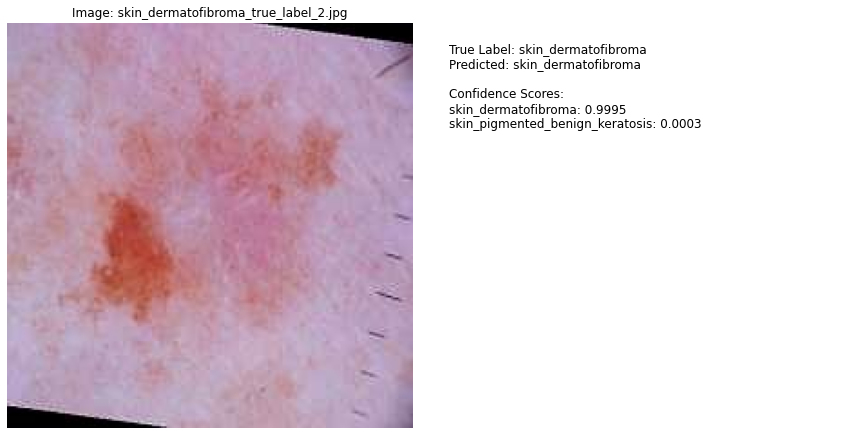


Top predictions for ./medxformer_images_for_inferences/skin_cancer/skin_dermatofibroma/skin_dermatofibroma_true_label_3.jpg:
skin_dermatofibroma: 0.9924
skin_vascular_lesion: 0.0046


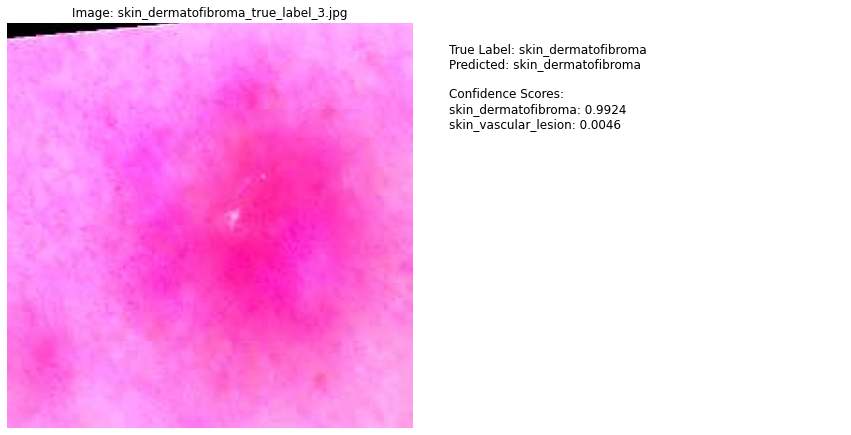


Classifying images in skin_melanoma folder:

Top predictions for ./medxformer_images_for_inferences/skin_cancer/skin_melanoma/skin_melanoma_true_label_1.jpg:
skin_melanoma: 0.7979
skin_squamous_cell_carcinoma: 0.1972


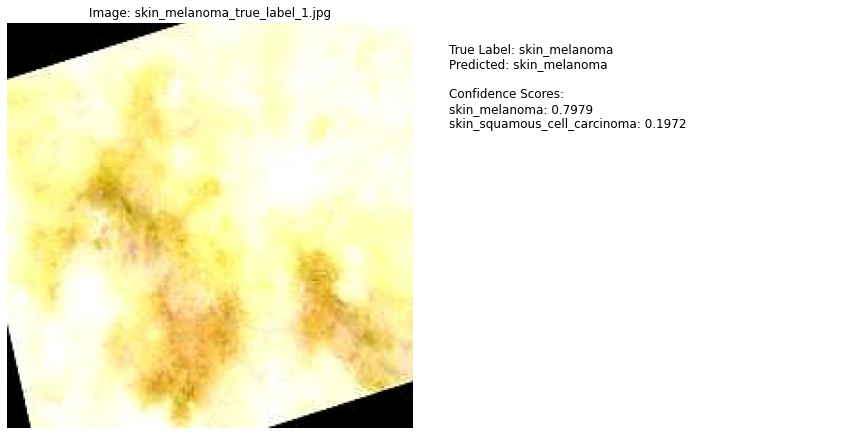


Top predictions for ./medxformer_images_for_inferences/skin_cancer/skin_melanoma/skin_melanoma_true_label_2.jpg:
skin_melanoma: 0.9862
skin_squamous_cell_carcinoma: 0.0057


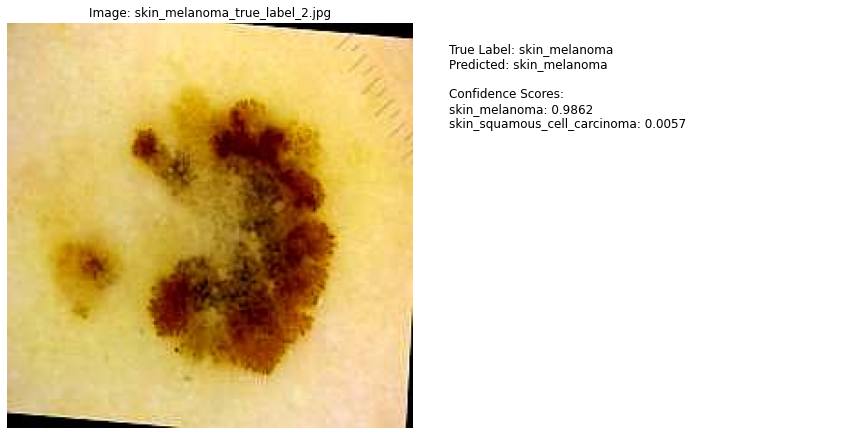


Top predictions for ./medxformer_images_for_inferences/skin_cancer/skin_melanoma/skin_melanoma_true_label_3.jpg:
skin_melanoma: 0.5239
skin_seborrheic_keratosis: 0.4746


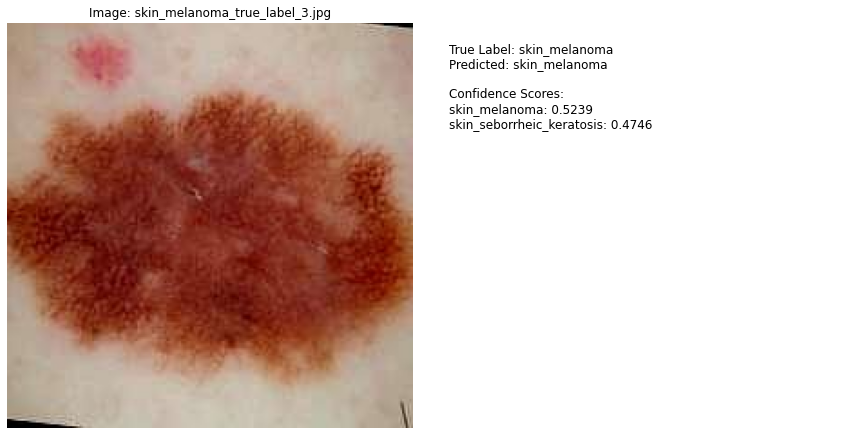


Classifying images in skin_nevus folder:

Top predictions for ./medxformer_images_for_inferences/skin_cancer/skin_nevus/skin_nevus_true_label_1.jpg:
skin_nevus: 0.9989
skin_melanoma: 0.0010


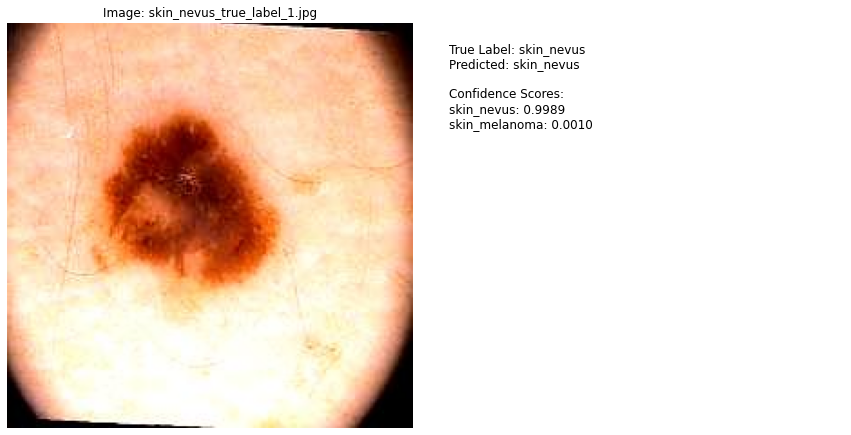


Top predictions for ./medxformer_images_for_inferences/skin_cancer/skin_nevus/skin_nevus_true_label_2.jpg:
skin_nevus: 0.8745
skin_melanoma: 0.1122


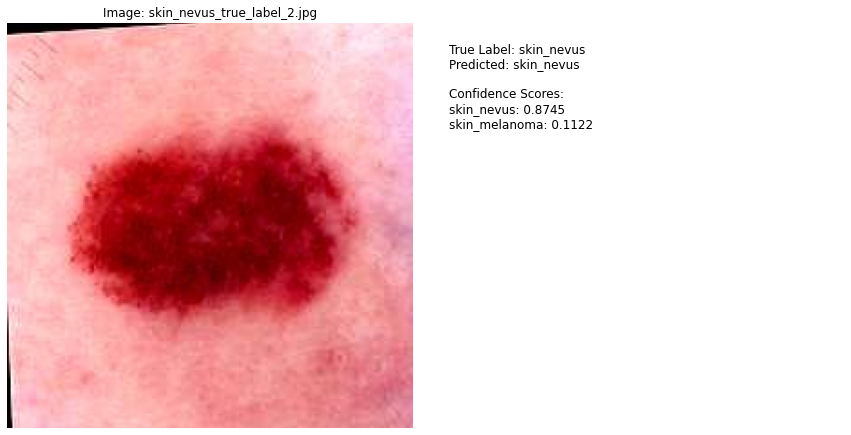


Top predictions for ./medxformer_images_for_inferences/skin_cancer/skin_nevus/skin_nevus_true_label_3.jpg:
skin_nevus: 0.5677
skin_melanoma: 0.4310


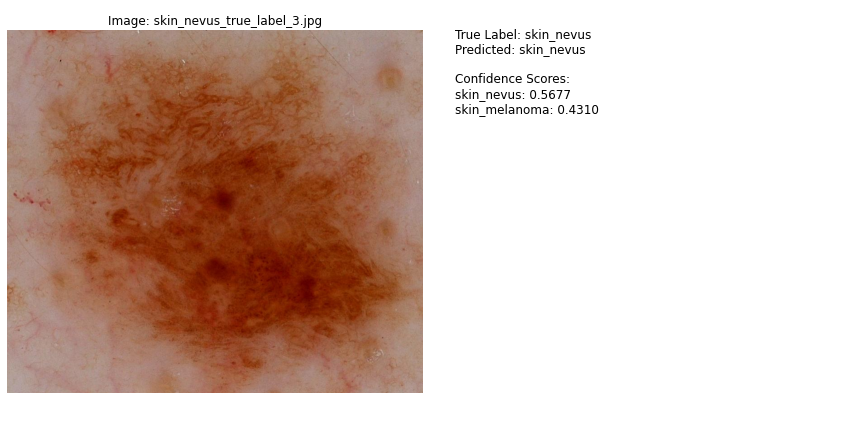


Classifying images in skin_pigmented_benign_keratosis folder:

Top predictions for ./medxformer_images_for_inferences/skin_cancer/skin_pigmented_benign_keratosis/skin_pigmented_benign_keratosis_true_label_1.jpg:
skin_pigmented_benign_keratosis: 0.9939
skin_squamous_cell_carcinoma: 0.0043


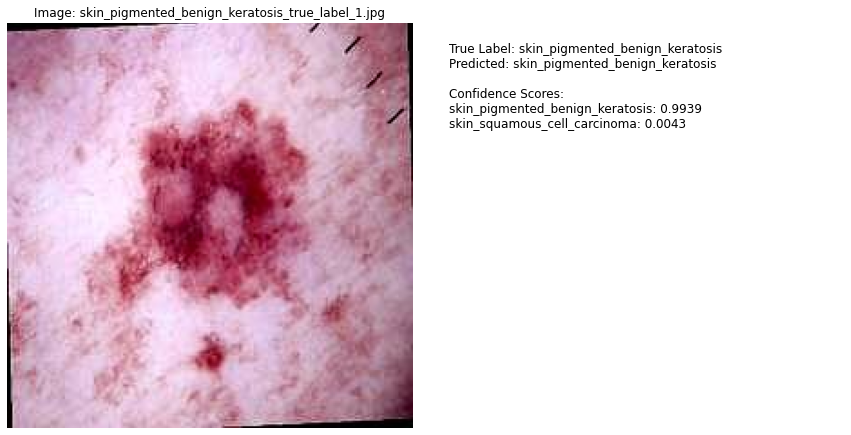


Top predictions for ./medxformer_images_for_inferences/skin_cancer/skin_pigmented_benign_keratosis/skin_pigmented_benign_keratosis_true_label_2.jpg:
skin_pigmented_benign_keratosis: 1.0000
skin_nevus: 0.0000


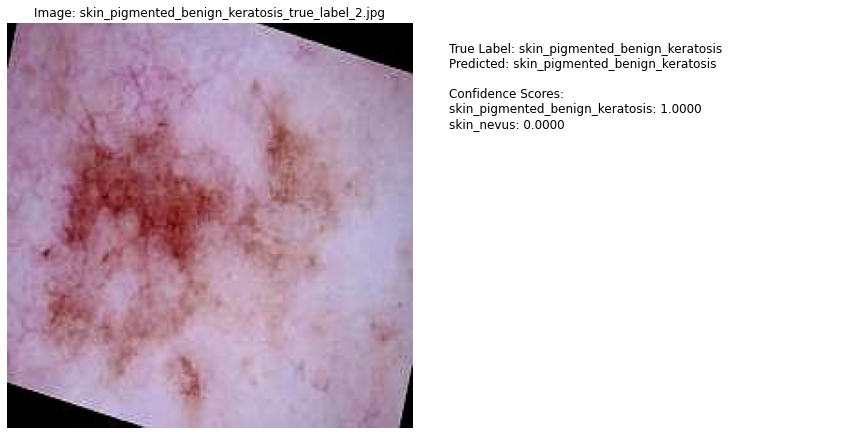


Top predictions for ./medxformer_images_for_inferences/skin_cancer/skin_pigmented_benign_keratosis/skin_pigmented_benign_keratosis_true_label_3.jpg:
skin_pigmented_benign_keratosis: 0.9999
skin_basal_cell_carcinoma: 0.0000


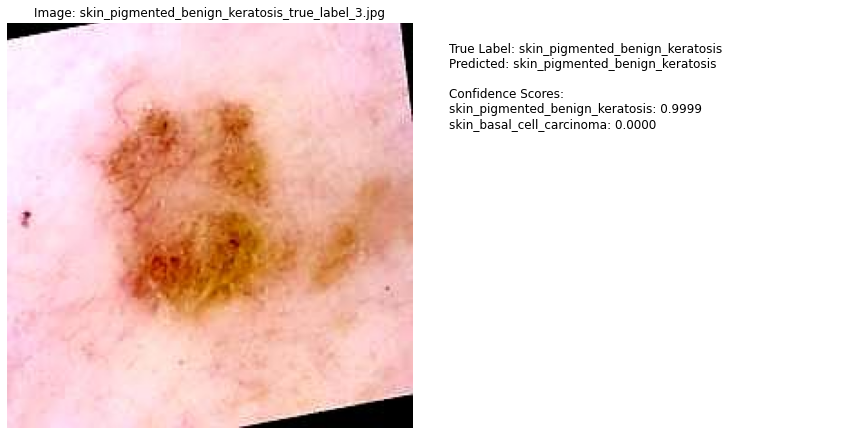


Classifying images in skin_seborrheic_keratosis folder:

Top predictions for ./medxformer_images_for_inferences/skin_cancer/skin_seborrheic_keratosis/skin_seborrheic_keratosis_true_label_1.jpg:
skin_melanoma: 0.9095
skin_seborrheic_keratosis: 0.0904


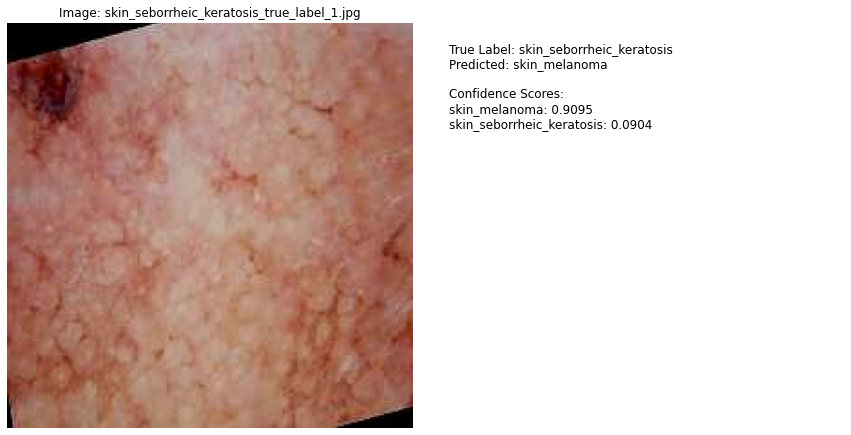


Top predictions for ./medxformer_images_for_inferences/skin_cancer/skin_seborrheic_keratosis/skin_seborrheic_keratosis_true_label_2.jpg:
skin_seborrheic_keratosis: 0.6106
skin_melanoma: 0.3882


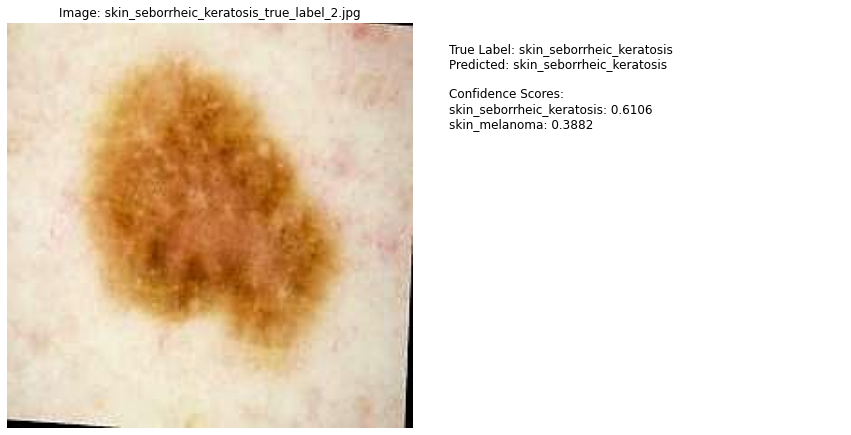


Top predictions for ./medxformer_images_for_inferences/skin_cancer/skin_seborrheic_keratosis/skin_seborrheic_keratosis_true_label_3.jpg:
skin_melanoma: 0.8874
skin_seborrheic_keratosis: 0.1126


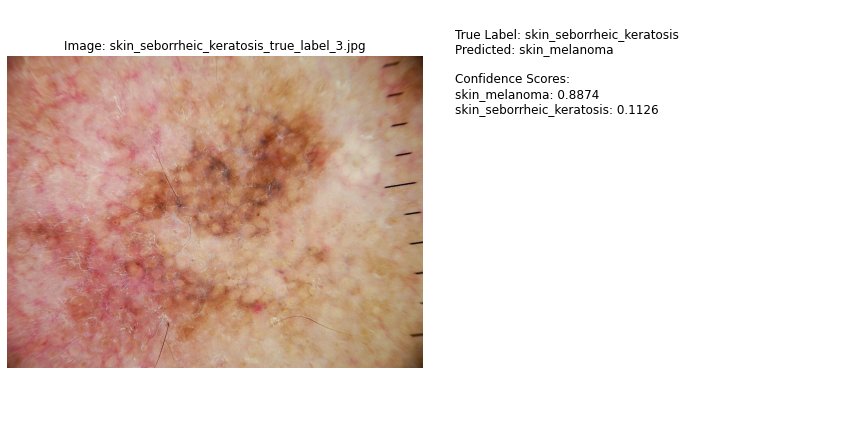


Classifying images in skin_squamous_cell_carcinoma folder:

Top predictions for ./medxformer_images_for_inferences/skin_cancer/skin_squamous_cell_carcinoma/skin_squamous_cell_carcinoma_true_label_1.jpg:
skin_squamous_cell_carcinoma: 0.9997
skin_basal_cell_carcinoma: 0.0001


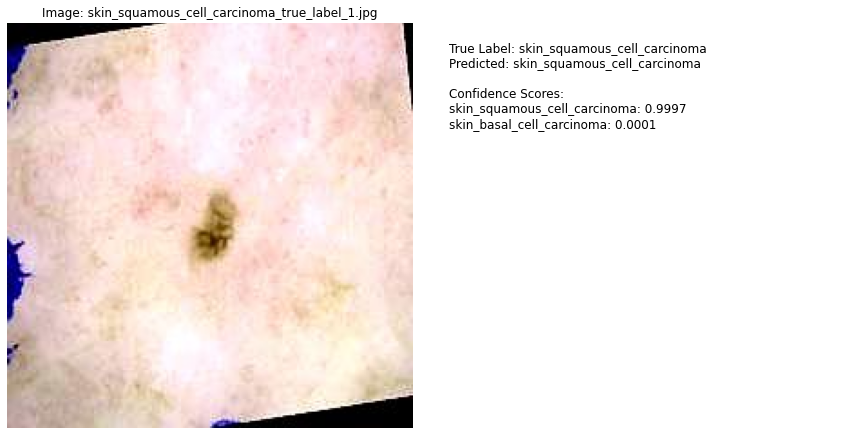


Top predictions for ./medxformer_images_for_inferences/skin_cancer/skin_squamous_cell_carcinoma/skin_squamous_cell_carcinoma_true_label_2.jpg:
skin_squamous_cell_carcinoma: 0.9984
skin_basal_cell_carcinoma: 0.0010


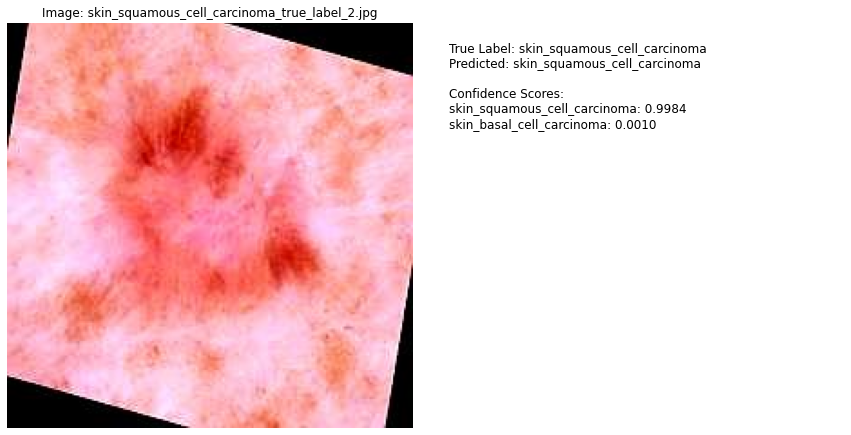


Top predictions for ./medxformer_images_for_inferences/skin_cancer/skin_squamous_cell_carcinoma/skin_squamous_cell_carcinoma_true_label_3.jpg:
skin_squamous_cell_carcinoma: 1.0000
skin_melanoma: 0.0000


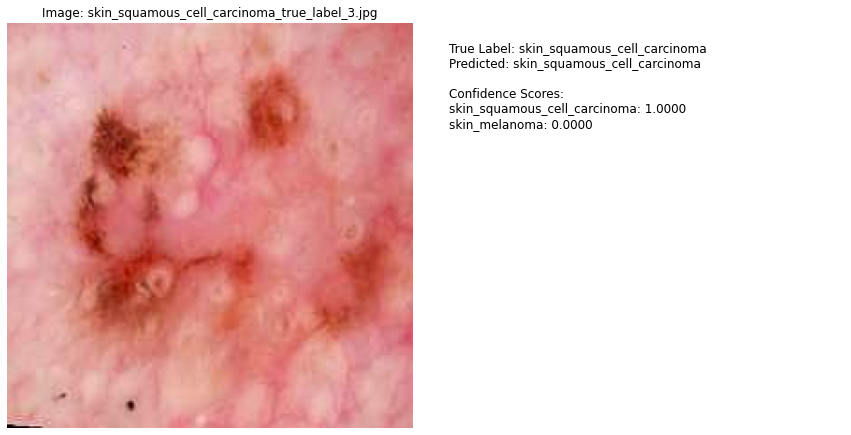


Classifying images in skin_vascular_lesion folder:

Top predictions for ./medxformer_images_for_inferences/skin_cancer/skin_vascular_lesion/skin_vascular_lesion_true_label_1.jpg:
skin_vascular_lesion: 0.9998
skin_nevus: 0.0000


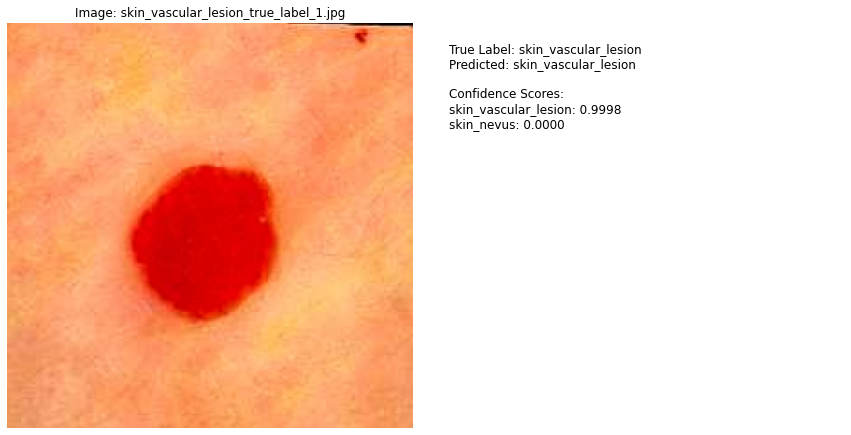


Top predictions for ./medxformer_images_for_inferences/skin_cancer/skin_vascular_lesion/skin_vascular_lesion_true_label_2.jpg:
skin_vascular_lesion: 0.9999
skin_dermatofibroma: 0.0001


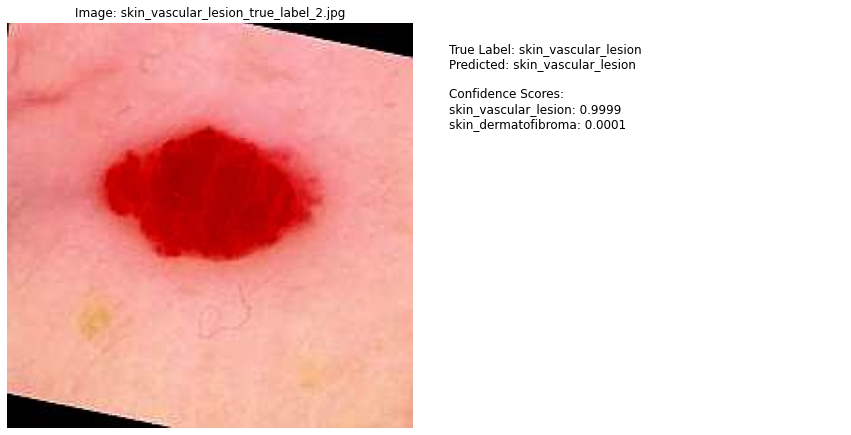


Top predictions for ./medxformer_images_for_inferences/skin_cancer/skin_vascular_lesion/skin_vascular_lesion_true_label_3.jpg:
skin_vascular_lesion: 0.9996
skin_pigmented_benign_keratosis: 0.0001


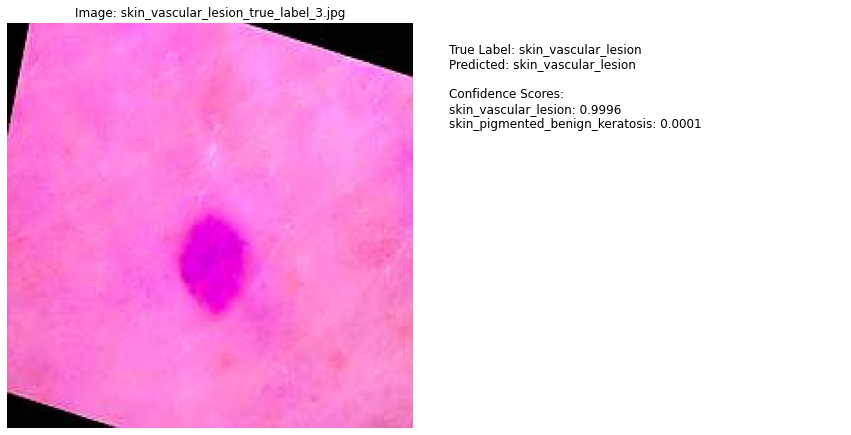

In [7]:
MODEL_PATH = "google/vit-base-patch16-224-in21k" 
ADAPTER_PATH = "./medxformer_v3/SKIN_CANCER_ADAPTER_MODEL_loha"
IMAGES_FOLDER = "./medxformer_images_for_inferences/skin_cancer" 
MAPPINGS_PATH = "./medxformer_v3/SKIN_CANCER_ADAPTER_MODEL_loha/mappings.json" 

label2id, id2label = load_mappings()
num_labels = len(id2label)
model, processor = load_model(num_labels)
model.eval()
for skin_type in os.listdir(IMAGES_FOLDER):
    skin_path = os.path.join(IMAGES_FOLDER, skin_type)
    if not os.path.isdir(skin_path):
        continue
    
    print(f"\nClassifying images in {skin_type} folder:")
    for image_name in os.listdir(skin_path):
        image_path = os.path.join(skin_path, image_name)
        if not image_name.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
            continue
        true_label = skin_type
        prediction, top_prob, top_predid = classify_image(model, processor, image_path, id2label)
        visualize_image(image_path, prediction, true_label, top_prob, top_predid, id2label)